# Introduction to the Dataset

● userid - user id.\
● Churn – Whether the user/customer will Churn or not.\
● Age - age of the customer. \
● Housing – Own House or in Rented House. \
● Credit score - Customer's credit score.\
● Deposits- Number of Deposits the customer has done.\
● Withdrawals – Number of withdrawals by the person.\
● Purchases- Number of Purchases done by Customer outside of our partner stores.\
● Purchases partners - Number of Purchases done by Customer with our partner stores.\
● cc taken- Number of Credit Card taken by the customer.\
● cc recommended- Number of Credit Card Recommendations done to the person.\
● cc disliked- Whether a person has disliked the credit card.\
● cc liked- Whether a person has liked the credit card or not.\
● cc application begin- Whether a person has began the application for credit card, doesn’t necessarily mean he/she has finished it.\
● App downloaded- Whether the customer has downloaded the app.\
● Web user- Whether or not the customer has visited our website at least one time.\
● App web user- Whether the customer has used both the app as well as the website.\
● IOS user- Is the customer an IOS user or not.\
● Android user- Is the customer an android user or not.\
● Registered Phones- Whether the customer has 1 registered phone number, if more than 1, then how many registered phones the customer has.\
● Payment Type- How Frequently the customer makes the payment(Monthly, Bi-Weekly ,etc).\
● Cancelled Loan- At any point in past whether the user has cancelled loan or not.\
● Received Loan- At any point in past the user has received loan.\
● Rejected Loan- At any point the user has rejected loan or not.\
● Zodiac Sign- Zodiac Sign of the user.\
● Left for two months or plus- Whether the user has left us for two or more than two months and then came back to us.\
● Left for One Month- Whether the customer/user left us for 1 month and came back to us the next month.\
● Reward Earned- How many rewards the user has earned.\
● Is referred- Whether the person was referred about us by somebody else.


# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# to suppress warnings 
from warnings import filterwarnings 
filterwarnings('ignore') 

# display all columns of the dataframe 
pd.options.display.max_columns = None 
# display all rows of the dataframe 
pd.options.display.max_rows = None 

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler

# Importing Dataset

In [3]:
df = pd.read_csv('churn_data.csv')
churn = df.copy()
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
0,55409,0,37.0,na,NaN,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,Leo,1,0,NaN,0.00,0
1,23547,0,28.0,R,486.0,0,0,1,0,0,96,0,0,5,1,1,1,1,0,0,Weekly,0,0,0,0,Leo,0,0,44.0,1.47,1
2,58313,0,35.0,R,561.0,47,2,86,47,0,285,0,0,9,1,0,0,0,1,2,Semi-Monthly,0,0,0,0,Capricorn,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,74,0,0,26,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,Capricorn,0,0,33.0,1.10,1
4,61353,1,27.0,na,NaN,0,0,2,0,0,0,0,0,0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Aries,1,0,1.0,0.03,0


In [4]:
churn['churn'].value_counts()

0    15826
1    11174
Name: churn, dtype: int64

# Exploratory Data Analysis (EDA)

In [5]:
churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27000 entries, 0 to 26999
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   user                     27000 non-null  int64  
 1   churn                    27000 non-null  int64  
 2   age                      26996 non-null  float64
 3   housing                  27000 non-null  object 
 4   credit_score             18969 non-null  float64
 5   deposits                 27000 non-null  int64  
 6   withdrawal               27000 non-null  int64  
 7   purchases_partners       27000 non-null  int64  
 8   purchases                27000 non-null  int64  
 9   cc_taken                 27000 non-null  int64  
 10  cc_recommended           27000 non-null  int64  
 11  cc_disliked              27000 non-null  int64  
 12  cc_liked                 27000 non-null  int64  
 13  cc_application_begin     27000 non-null  int64  
 14  app_downloaded        

 We can observe that most of our features are numerical in nature

In [7]:
churn.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
user,27000.0,35422.702519,20321.006678,1.0,17810.5,35749.00,53244.25,69658.0
churn,27000.0,0.413852,0.492532,0.0,0.0,0.00,1.00,1.0
age,26996.0,32.219921,9.964838,17.0,25.0,30.00,37.00,91.0
credit_score,18969.0,542.944225,61.059315,2.0,507.0,542.00,578.00,838.0
deposits,27000.0,3.341556,9.131406,0.0,0.0,0.00,1.00,65.0
withdrawal,27000.0,0.307000,1.055416,0.0,0.0,0.00,0.00,29.0
purchases_partners,27000.0,28.062519,42.219686,0.0,0.0,9.00,43.00,1067.0
purchases,27000.0,3.273481,8.953077,0.0,0.0,0.00,1.00,63.0
cc_taken,27000.0,0.073778,0.437299,0.0,0.0,0.00,0.00,29.0
cc_recommended,27000.0,92.625778,88.869343,0.0,10.0,65.00,164.00,522.0


From the above descriptive statistics table we can observe that most of our customer base are from middle age group from 25 to 37, we can also observe that majority of our customers are Android users.

In [8]:
churn.isnull().sum()

user                          0
churn                         0
age                           4
housing                       0
credit_score               8031
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3227
reward_rate                   0
is_referred                   0
dtype: i

In [9]:
print('Percentage of Null Values in a Feature is :')
print('\n')
print((churn.isnull().sum()/len(churn)) * 100)

Percentage of Null Values in a Feature is :


user                        0.000000
churn                       0.000000
age                         0.014815
housing                     0.000000
credit_score               29.744444
deposits                    0.000000
withdrawal                  0.000000
purchases_partners          0.000000
purchases                   0.000000
cc_taken                    0.000000
cc_recommended              0.000000
cc_disliked                 0.000000
cc_liked                    0.000000
cc_application_begin        0.000000
app_downloaded              0.000000
web_user                    0.000000
app_web_user                0.000000
ios_user                    0.000000
android_user                0.000000
registered_phones           0.000000
payment_type                0.000000
waiting_4_loan              0.000000
cancelled_loan              0.000000
received_loan               0.000000
rejected_loan               0.000000
zodiac_sign                 0

# Null Value Treatment for Age

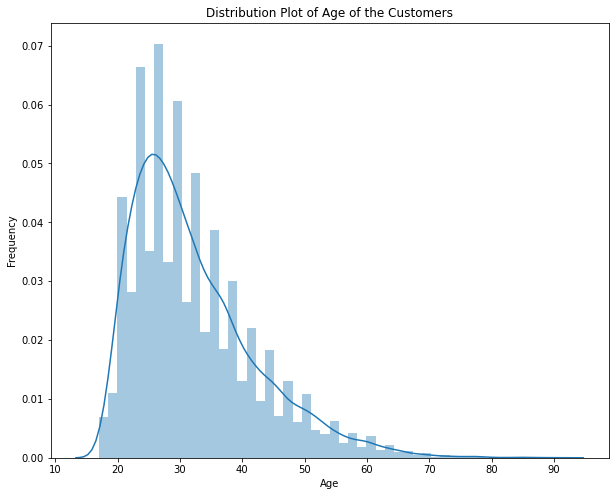

In [10]:
plt.figure(figsize = (10,8))
sns.distplot(churn['age'])
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution Plot of Age of the Customers')
plt.show()

In [11]:
churn['age'] = churn['age'].fillna(churn['age'].mean())

In [12]:
print('Percentage of Null Values in a Feature is :')
print('\n')
print((churn.isnull().sum()/len(churn)) * 100)

Percentage of Null Values in a Feature is :


user                        0.000000
churn                       0.000000
age                         0.000000
housing                     0.000000
credit_score               29.744444
deposits                    0.000000
withdrawal                  0.000000
purchases_partners          0.000000
purchases                   0.000000
cc_taken                    0.000000
cc_recommended              0.000000
cc_disliked                 0.000000
cc_liked                    0.000000
cc_application_begin        0.000000
app_downloaded              0.000000
web_user                    0.000000
app_web_user                0.000000
ios_user                    0.000000
android_user                0.000000
registered_phones           0.000000
payment_type                0.000000
waiting_4_loan              0.000000
cancelled_loan              0.000000
received_loan               0.000000
rejected_loan               0.000000
zodiac_sign                 0

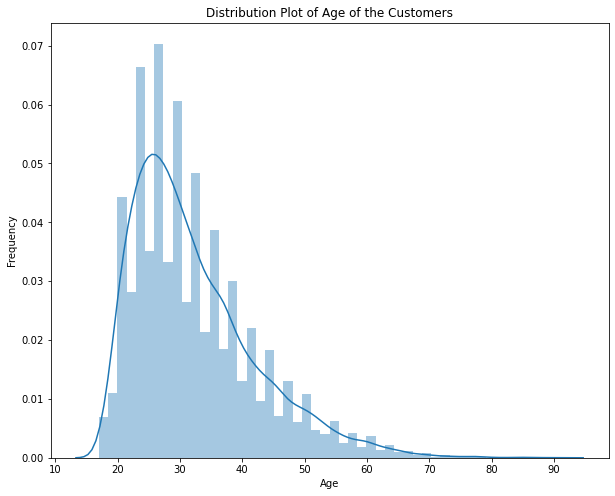

In [13]:
plt.figure(figsize = (10,8))
sns.distplot(churn['age'])
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution Plot of Age of the Customers')
plt.show()

As the Percentage of Null Values in Feature 'Age' was very less, we have imputed these Null values with Mean, we can see there has not been any change in the distribution of age so we can proceed with mean imputation for Age

# Outlier Treatment for Age

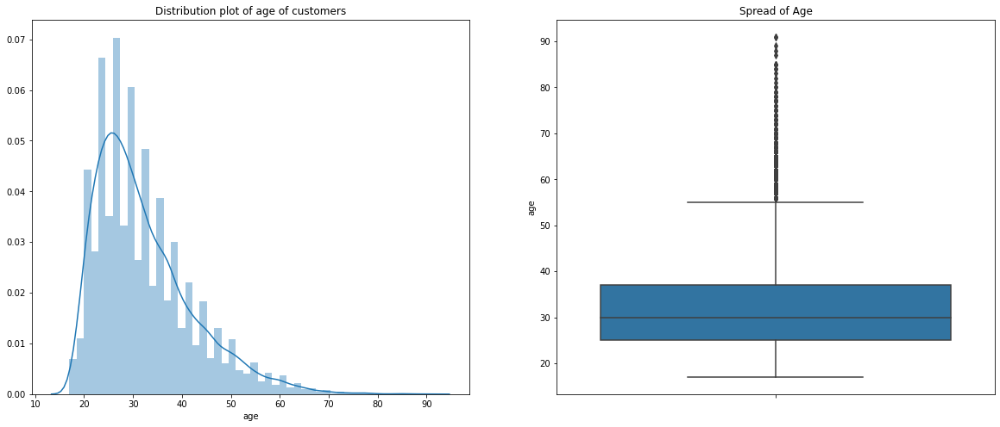

In [14]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of age of customers')
sns.distplot(churn.age)

plt.subplot(1,2,2)
plt.title('Spread of Age')
sns.boxplot(y=churn.age)

plt.show()

Looking at the above Chart we can see that too many outliers for age, we shall check for some outlier treatment

In [15]:
churn['age'].quantile(0.95)

52.0

In [16]:
q3 = churn['age'].quantile(0.75)
q1 = churn['age'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf

55.0

In [17]:
outliers = churn[churn['age'] > uf]

In [18]:
print('Percentage of Customers who are Outliers are :')
print((len(outliers)/len(churn))*100)

Percentage of Customers who are Outliers are :
3.1037037037037036


In [19]:
churn1 = churn.copy()

In [20]:
uc = churn1['age'].quantile(0.99)

for i in churn1.index:
    if churn1.loc[i,'age'] > uf:
        churn1.loc[i,'age'] = uc

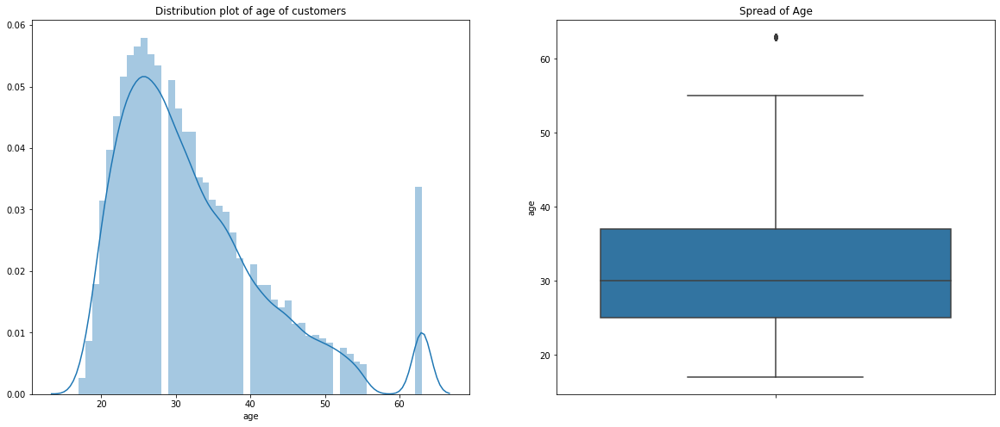

In [21]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of age of customers')
sns.distplot(churn1.age)

plt.subplot(1,2,2)
plt.title('Spread of Age')
sns.boxplot(y=churn1.age)

plt.show()

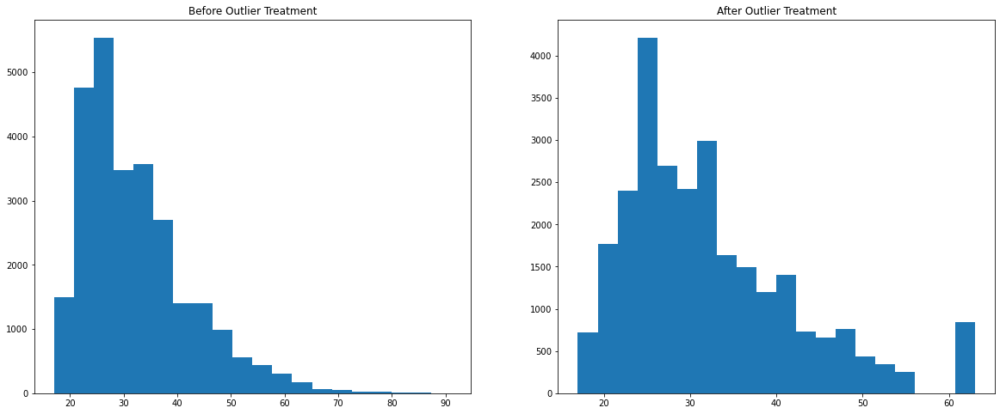

In [22]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Before Outlier Treatment')
plt.hist(churn.age,bins = 20)

plt.subplot(1,2,2)
plt.title('After Outlier Treatment')
plt.hist(churn1.age,bins = 20)

plt.show()

In [23]:
q3 = churn1['age'].quantile(0.75)
q1 = churn1['age'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf

55.0

In [24]:
outliers = churn[churn['age'] > uf]

In [25]:
print('Percentage of Customers who are Outliers are :')
print((len(outliers)/len(churn))*100)

Percentage of Customers who are Outliers are :
3.1037037037037036


Even after doing the outlier treatment we can see that the data is not normally distributed and there is huge spike for people who are around 60 to 65 years old, this could affect our analysis, also the percentage of outliers is very less, so its best for us to drop the outliers

In [26]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [27]:
churn.shape

(26162, 31)

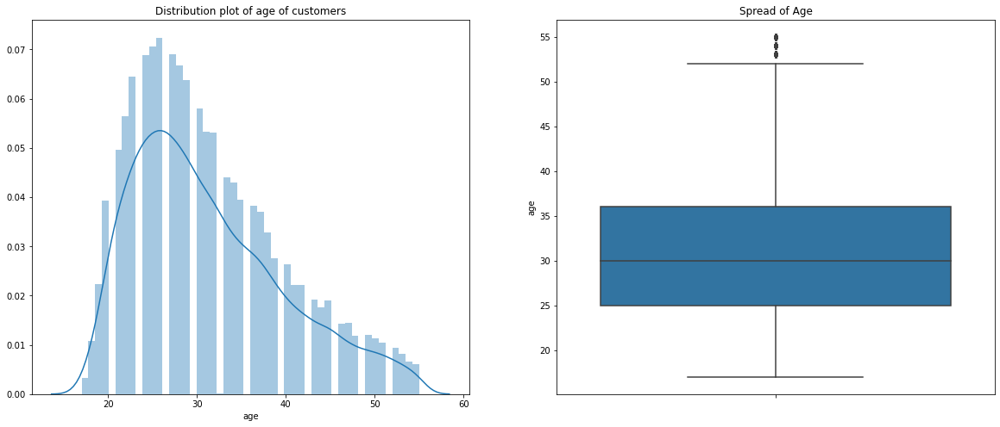

In [28]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of age of customers')
sns.distplot(churn.age)

plt.subplot(1,2,2)
plt.title('Spread of Age')
sns.boxplot(y=churn.age)

plt.show()

In [29]:
churn2 = churn.copy()
q3 = churn2['age'].quantile(0.75)
q1 = churn2['age'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn2[churn2['age'] > uf]
print('Percentage of Customers who are Outliers are :')
print((len(outliers)/len(churn2))*100)

Percentage of Customers who are Outliers are :
1.582447825089825


In [30]:
uc = churn2['age'].quantile(0.99)

for i in churn.index:
    if churn2.loc[i,'age'] > uf:
        churn2.loc[i,'age'] = uc

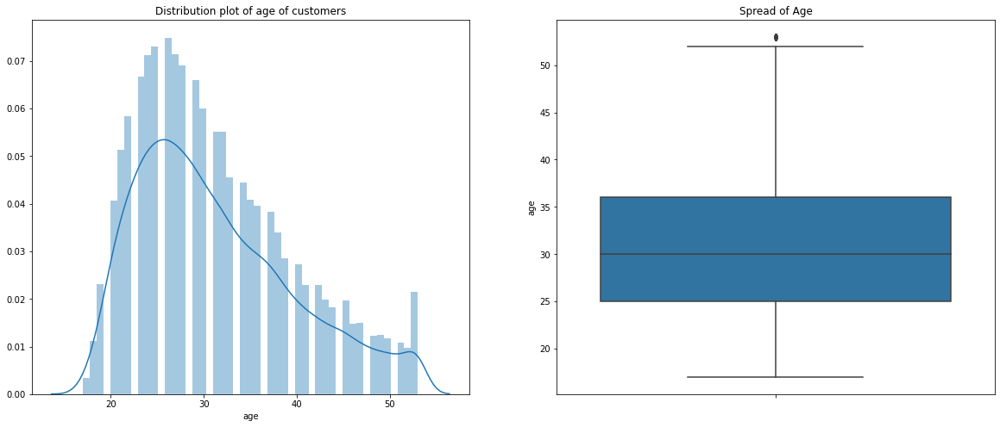

In [31]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of age of customers')
sns.distplot(churn2.age)

plt.subplot(1,2,2)
plt.title('Spread of Age')
sns.boxplot(y=churn2.age)

plt.show()

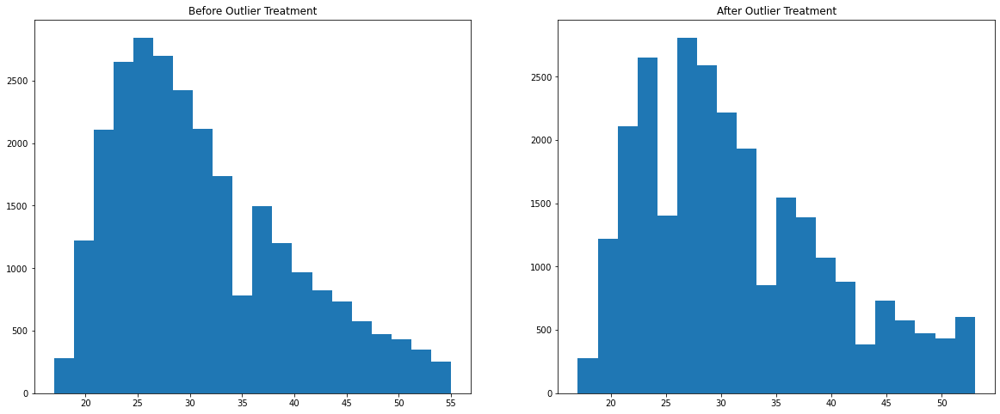

In [32]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Before Outlier Treatment')
plt.hist(churn.age,bins = 20)

plt.subplot(1,2,2)
plt.title('After Outlier Treatment')
plt.hist(churn2.age,bins = 20)

plt.show()

In [33]:
churn2['age'].skew()

0.7188657969988862

Looking at above diagram and the Boxplot we can say that after replacing Outliers with 0.99 Quantile, our Feature age is free from outliers and is slightly normally distributed. So we shall do the following changes in our Churn dataset

In [34]:
q3 = churn['age'].quantile(0.75)
q1 = churn['age'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['age'] > uf]
uc = churn['age'].quantile(0.99)

for i in churn.index:
    if churn.loc[i,'age'] > uf:
        churn.loc[i,'age'] = uc

In [35]:
churn['age'].describe()

count    26162.000000
mean        31.251887
std          8.447707
min         17.000000
25%         25.000000
50%         30.000000
75%         36.000000
max         53.000000
Name: age, dtype: float64

In [36]:
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
0,55409,0,37.0,na,NaN,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,Leo,1,0,NaN,0.00,0
1,23547,0,28.0,R,486.0,0,0,1,0,0,96,0,0,5,1,1,1,1,0,0,Weekly,0,0,0,0,Leo,0,0,44.0,1.47,1
2,58313,0,35.0,R,561.0,47,2,86,47,0,285,0,0,9,1,0,0,0,1,2,Semi-Monthly,0,0,0,0,Capricorn,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,74,0,0,26,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,Capricorn,0,0,33.0,1.10,1
4,61353,1,27.0,na,NaN,0,0,2,0,0,0,0,0,0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Aries,1,0,1.0,0.03,0


In [37]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

# Null Value Treatment of Housing

In [38]:
churn['housing'].value_counts()

na    13345
R     10766
O      2051
Name: housing, dtype: int64

In [39]:
churn['housing'] = churn['housing'].replace({'na':np.nan})

In [40]:
churn.isnull().sum()

user                           0
churn                          0
age                            0
housing                    13345
credit_score                7697
deposits                       0
withdrawal                     0
purchases_partners             0
purchases                      0
cc_taken                       0
cc_recommended                 0
cc_disliked                    0
cc_liked                       0
cc_application_begin           0
app_downloaded                 0
web_user                       0
app_web_user                   0
ios_user                       0
android_user                   0
registered_phones              0
payment_type                   0
waiting_4_loan                 0
cancelled_loan                 0
received_loan                  0
rejected_loan                  0
zodiac_sign                    0
left_for_two_month_plus        0
left_for_one_month             0
rewards_earned              3020
reward_rate                    0
is_referre

In [41]:
churn.describe()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
count,26162.00000,26162.000000,26162.000000,18465.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.00000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,26162.000000,23142.000000,26162.000000,26162.000000
mean,35290.93869,0.416176,31.251887,542.541890,3.334111,0.306131,28.358765,3.265232,0.072013,93.068573,0.051296,0.012881,8.106987,0.955584,0.599113,0.557908,0.390987,0.593036,0.41996,0.001300,0.018500,0.018271,0.004816,0.173840,0.017736,29.119177,0.912104,0.320541
std,20277.51710,0.492933,8.447707,60.939531,9.076822,1.047790,42.447300,8.896275,0.431648,88.760985,0.882431,0.237903,12.173512,0.206020,0.490087,0.496645,0.487981,0.491278,0.91216,0.036027,0.134754,0.133931,0.069232,0.378979,0.131992,21.944750,0.750843,0.466694
min,1.00000,0.000000,17.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,17705.00000,0.000000,25.000000,507.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.200000,0.000000
50%,35596.00000,0.000000,30.000000,541.000000,0.000000,0.000000,9.000000,0.000000,0.000000,66.000000,0.000000,0.000000,4.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000,0.800000,0.000000
75%,53028.00000,1.000000,36.000000,578.000000,1.000000,0.000000,44.000000,1.000000,0.000000,164.000000,0.000000,0.000000,11.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,48.000000,1.530000,1.000000
max,69658.00000,1.000000,53.000000,838.000000,65.000000,29.000000,1067.000000,63.000000,29.000000,522.000000,65.000000,27.000000,263.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,114.000000,4.000000,1.000000


In [42]:
churn.groupby('housing')[['purchases_partners']].mean()

,purchases_partners
housing,
O,39.756216
R,39.160970


In [43]:
churn['housing'].fillna(method = 'bfill',inplace = True)

In [44]:
churn['housing'].value_counts()/len(churn) * 100

R    83.667151
O    16.317560
Name: housing, dtype: float64

In [45]:
churn['housing'].value_counts()/len(churn) * 100

R    83.667151
O    16.317560
Name: housing, dtype: float64

In [46]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       4
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

In [47]:
churn['housing'] = churn['housing'].replace({np.nan : 'R'})

In [48]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

After Finding no conclusive relation of housing with other features, we imputed null values with backward fill

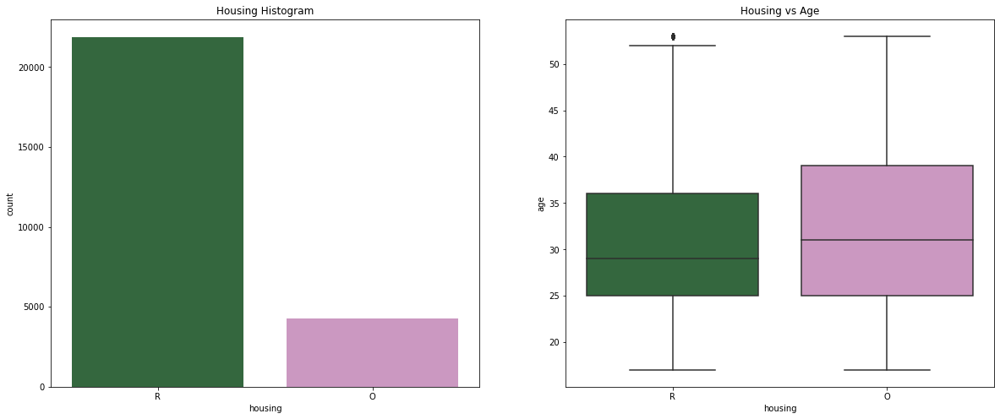

In [49]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Housing Histogram')
sns.countplot(churn.housing, palette=("cubehelix"))

plt.subplot(1,2,2)
plt.title('Housing vs Age')
sns.boxplot(x=churn.housing, y=churn.age, palette=("cubehelix"))

plt.show()

We can observe that Most of our Customer Base stay in a Rented Apartment, although the median age for both (the customers staying in own house or customers living in a rented apartment) are almost equal.

In [50]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

In [51]:
churn['credit_score'].describe()

count    18465.000000
mean       542.541890
std         60.939531
min          2.000000
25%        507.000000
50%        541.000000
75%        578.000000
max        838.000000
Name: credit_score, dtype: float64

In [52]:
churn['credit_score'].quantile(0.15)

485.0

In [53]:
churn['credit_score'].quantile(0.90)

617.6000000000022

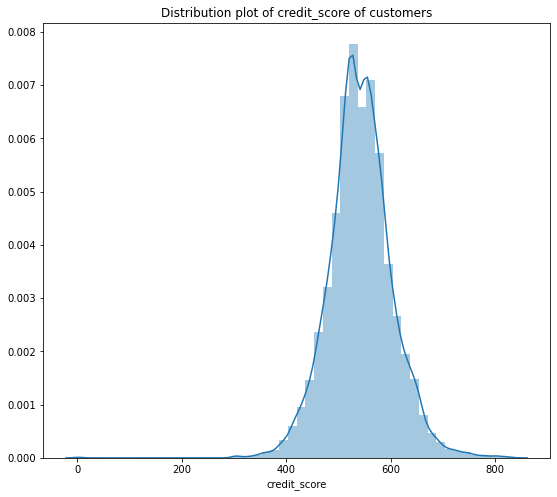

In [54]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of credit_score of customers')
sns.distplot(churn.credit_score)

We can observe that majority of customers have a credit score between 450 to 600

In [57]:
churn.corr()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
user,1.000000,0.069604,-0.052835,-0.049694,-0.183147,-0.112802,-0.295442,-0.183241,-0.077201,-0.521347,-0.037161,-0.027863,-0.318530,-0.291415,-0.050120,-0.162084,-0.041268,-0.092506,-0.095727,0.017702,0.005228,-0.030183,0.027624,-0.026372,-0.029833,-0.454162,-0.487251,-0.162633
churn,0.069604,1.000000,-0.060911,-0.120893,-0.134879,-0.068988,-0.263890,-0.135394,0.059451,-0.199769,0.008831,0.011326,-0.117552,-0.058870,0.039534,0.015066,0.020489,-0.040404,0.029200,-0.015390,0.034856,0.050412,0.056633,0.007004,0.037538,-0.169597,-0.168290,-0.083421
age,-0.052835,-0.060911,1.000000,0.026389,0.108228,0.051786,0.025738,0.107917,0.079338,0.137664,0.009435,0.020810,0.180885,-0.084043,0.208614,0.172036,0.175953,-0.212764,-0.004591,0.004953,-0.014201,0.000899,0.009690,-0.023456,0.033463,0.157907,0.129386,0.019101
credit_score,-0.049694,-0.120893,0.026389,1.000000,0.043215,0.004700,0.051705,0.044201,0.025253,0.126841,0.014533,0.027872,0.080105,0.019918,0.000113,0.005732,-0.039200,0.035271,-0.012172,0.021473,0.068916,0.091452,0.016732,0.011069,0.011120,0.145615,0.153006,-0.032474
deposits,-0.183147,-0.134879,0.108228,0.043215,1.000000,0.487825,0.328313,0.998502,-0.045859,0.375680,-0.014600,-0.011534,0.450604,0.079193,0.077457,0.106911,0.043032,-0.004344,0.041395,-0.002731,0.012916,-0.008858,-0.018741,0.048210,-0.010785,0.249169,0.266690,0.227595
withdrawal,-0.112802,-0.068988,0.051786,0.004700,0.487825,1.000000,0.225510,0.487213,-0.039871,0.187818,-0.011031,-0.002479,0.296332,0.062990,0.047395,0.071010,0.040265,-0.006432,0.048895,0.002624,-0.001940,-0.006355,-0.010840,0.033568,-0.008304,0.095742,0.126071,0.208541
purchases_partners,-0.295442,-0.263890,0.025738,0.051705,0.328313,0.225510,1.000000,0.328319,-0.100473,0.595327,-0.035500,-0.032492,0.422642,0.144030,0.067007,0.121553,0.029049,0.044874,0.070932,0.000170,0.016342,-0.014090,-0.030648,0.083505,-0.030691,0.404912,0.432056,0.299391
purchases,-0.183241,-0.135394,0.107917,0.044201,0.998502,0.487213,0.328319,1.000000,-0.045876,0.376263,-0.014500,-0.011620,0.451095,0.079131,0.077036,0.106471,0.042150,-0.003499,0.041056,-0.002507,0.013221,-0.008687,-0.018583,0.048533,-0.010973,0.249769,0.267230,0.227736
cc_taken,-0.077201,0.059451,0.079338,0.025253,-0.045859,-0.039871,-0.100473,-0.045876,1.000000,0.115005,0.183383,0.156610,0.160361,0.035968,0.057509,0.070592,0.063222,-0.044934,0.040852,-0.006018,0.003382,0.045344,0.006301,-0.016477,0.086271,0.149301,0.148951,-0.022561
cc_recommended,-0.521347,-0.199769,0.137664,0.126841,0.375680,0.187818,0.595327,0.376263,0.115005,1.000000,0.047461,0.054928,0.615342,0.224874,0.134309,0.219531,0.021992,0.089910,0.125625,-0.017982,0.016196,0.045300,-0.037096,0.045275,0.038814,0.915700,0.876315,0.239041


# Null value treatment for payment type

In [58]:
churn.groupby('payment_type')[['rewards_earned']].mean()

,rewards_earned
payment_type,
Bi-Weekly,29.104596
Monthly,27.813793
Semi-Monthly,30.077965
Weekly,28.650195
na,29.980531


In [59]:
cat_cols = churn.select_dtypes(include = 'object')
print('Categorical Columns are : ',cat_cols.columns)
print('% Values in each categorical columns')
for i in cat_cols.columns:
    print('\n% Values in column ',i)
    print((churn[i].value_counts()/len(churn[i])*100))

Categorical Columns are :  Index(['housing', 'payment_type', 'zodiac_sign'], dtype='object')
% Values in each categorical columns

% Values in column  housing
R    83.68244
O    16.31756
Name: housing, dtype: float64

% Values in column  payment_type
Bi-Weekly       47.614861
Weekly          19.799710
na              14.421680
Semi-Monthly     9.104809
Monthly          9.058940
Name: payment_type, dtype: float64

% Values in column  zodiac_sign
Cancer         8.990138
Virgo          8.906047
Leo            8.833423
Taurus         8.290651
Gemini         7.988686
na             7.958107
Pisces         7.896950
Libra          7.896950
Aquarius       7.828148
Scorpio        7.801391
Sagittarius    7.633208
Aries          7.461203
Capricorn      2.515098
Name: zodiac_sign, dtype: float64


In [60]:
churn['payment_type'] = churn['payment_type'].replace({'na':np.nan})

In [61]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type               3773
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

In [62]:
(churn['payment_type'].value_counts()/len(churn)) * 100

Bi-Weekly       47.614861
Weekly          19.799710
Semi-Monthly     9.104809
Monthly          9.058940
Name: payment_type, dtype: float64

In [63]:
churn['payment_type'].mode()

0    Bi-Weekly
dtype: object

In [64]:
churn['payment_type'] = churn['payment_type'].fillna(churn['payment_type'].mode()[0])

In [65]:
churn['payment_type'].value_counts()

Bi-Weekly       16230
Weekly           5180
Semi-Monthly     2382
Monthly          2370
Name: payment_type, dtype: int64

In [66]:
(churn['payment_type'].value_counts()/len(churn)) * 100

Bi-Weekly       62.036542
Weekly          19.799710
Semi-Monthly     9.104809
Monthly          9.058940
Name: payment_type, dtype: float64

As around 50 % of users paid Bi-Weekly, so we imputed the nul values with Bi-Weekly

# Null value treatment for Zodiac sign

In [67]:
churn['zodiac_sign'].value_counts()

Cancer         2352
Virgo          2330
Leo            2311
Taurus         2169
Gemini         2090
na             2082
Pisces         2066
Libra          2066
Aquarius       2048
Scorpio        2041
Sagittarius    1997
Aries          1952
Capricorn       658
Name: zodiac_sign, dtype: int64

In [68]:
(churn['zodiac_sign'].value_counts()/len(churn)) * 100

Cancer         8.990138
Virgo          8.906047
Leo            8.833423
Taurus         8.290651
Gemini         7.988686
na             7.958107
Pisces         7.896950
Libra          7.896950
Aquarius       7.828148
Scorpio        7.801391
Sagittarius    7.633208
Aries          7.461203
Capricorn      2.515098
Name: zodiac_sign, dtype: float64

In [69]:
churn['zodiac_sign'] = churn['zodiac_sign'].replace({'na':np.nan})

In [70]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                2082
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

In [71]:
churn.groupby('zodiac_sign')[['churn']].mean()

,churn
zodiac_sign,
Aquarius,0.401855
Aries,0.424693
Cancer,0.429847
Capricorn,0.433131
Gemini,0.408134
Leo,0.413674
Libra,0.405131
Pisces,0.434172
Sagittarius,0.417126


In [72]:
(churn.isnull().sum()/len(churn)) *100

user                        0.000000
churn                       0.000000
age                         0.000000
housing                     0.000000
credit_score               29.420534
deposits                    0.000000
withdrawal                  0.000000
purchases_partners          0.000000
purchases                   0.000000
cc_taken                    0.000000
cc_recommended              0.000000
cc_disliked                 0.000000
cc_liked                    0.000000
cc_application_begin        0.000000
app_downloaded              0.000000
web_user                    0.000000
app_web_user                0.000000
ios_user                    0.000000
android_user                0.000000
registered_phones           0.000000
payment_type                0.000000
waiting_4_loan              0.000000
cancelled_loan              0.000000
received_loan               0.000000
rejected_loan               0.000000
zodiac_sign                 7.958107
left_for_two_month_plus     0.000000
l

In [73]:
churn['zodiac_sign'] = churn['zodiac_sign'].fillna(method = 'bfill')

In [74]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

In [75]:
(churn.isnull().sum()/len(churn)) *100

user                        0.000000
churn                       0.000000
age                         0.000000
housing                     0.000000
credit_score               29.420534
deposits                    0.000000
withdrawal                  0.000000
purchases_partners          0.000000
purchases                   0.000000
cc_taken                    0.000000
cc_recommended              0.000000
cc_disliked                 0.000000
cc_liked                    0.000000
cc_application_begin        0.000000
app_downloaded              0.000000
web_user                    0.000000
app_web_user                0.000000
ios_user                    0.000000
android_user                0.000000
registered_phones           0.000000
payment_type                0.000000
waiting_4_loan              0.000000
cancelled_loan              0.000000
received_loan               0.000000
rejected_loan               0.000000
zodiac_sign                 0.000000
left_for_two_month_plus     0.000000
l

As we could not find any conclusive evidence of any relation of zodiac_sign, we have filled in the null values with bfill for the time being. We might drop the variable zodiac_Sign if necessry ( a zodiac sign cannot tell if aperson will churn or not)

# Null Value and Outlier Treatment for Rewards earned

Skewness in rewards_earned is  0.37696135588861784


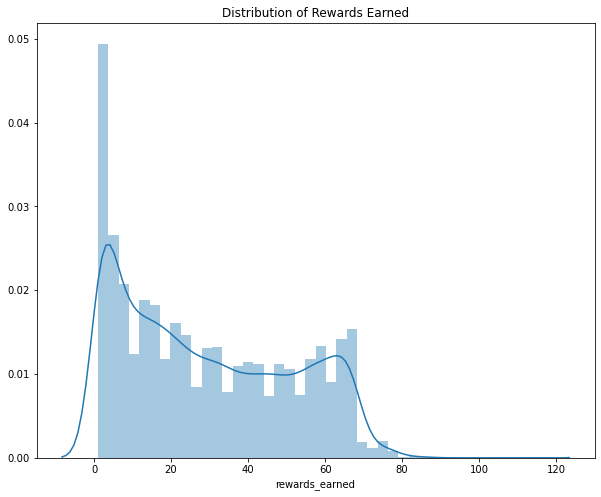

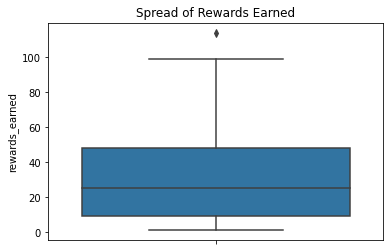

In [76]:
print('Skewness in rewards_earned is ',churn['rewards_earned'].skew())

# plt.subplot(1,2,1)
plt.figure(figsize = (10,8))
plt.title('Distribution of Rewards Earned')
sns.distplot(churn.rewards_earned)
plt.show()

# plt.subplot(1,2,2)
plt.title('Spread of Rewards Earned')
sns.boxplot(y=churn.rewards_earned)

plt.show()

We can observe that Rewards_earned is slightly Right Skewed

In [77]:
q3 = churn['rewards_earned'].quantile(0.75)
q1 = churn['rewards_earned'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['rewards_earned'] > uf]

outliers

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
7615,13563,0,28.0,O,563.0,42,4,268,42,0,522,0,0,100,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Cancer,0,0,114.0,3.8,1


There is only 1 outlier in Rewards Earned, its better to drop it

In [78]:
for i in outliers.index:
    churn.drop(i,inplace = True)

Skewness in rewards_earned is  0.3753174643202602


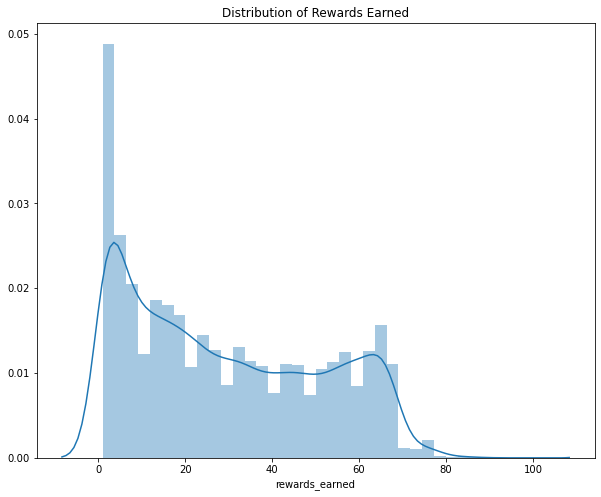

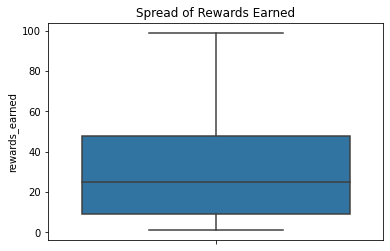

In [79]:
print('Skewness in rewards_earned is ',churn['rewards_earned'].skew())

# plt.subplot(1,2,1)
plt.figure(figsize = (10,8))
plt.title('Distribution of Rewards Earned')
sns.distplot(churn.rewards_earned)
plt.show()

# plt.subplot(1,2,2)
plt.title('Spread of Rewards Earned')
sns.boxplot(y=churn.rewards_earned)

plt.show()

In [80]:
churn.groupby('payment_type')[['rewards_earned']].median()

,rewards_earned
payment_type,
Bi-Weekly,25.0
Monthly,23.0
Semi-Monthly,26.0
Weekly,24.0


In [81]:
churn.corr()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
user,1.000000,0.069572,-0.052853,-0.049678,-0.183040,-0.112687,-0.295397,-0.183133,-0.077210,-0.521394,-0.037164,-0.027866,-0.318575,-0.291413,-0.050088,-0.162054,-0.041302,-0.092476,-0.095748,0.017701,0.005222,-0.030189,0.027622,-0.026391,-0.029839,-0.454154,-0.487242,-0.162584
churn,0.069572,1.000000,-0.060924,-0.120880,-0.134790,-0.068891,-0.263872,-0.135305,0.059446,-0.199705,0.008829,0.011325,-0.117438,-0.058864,0.039562,0.015096,0.020464,-0.040378,0.029185,-0.015391,0.034852,0.050408,0.056632,0.006990,0.037534,-0.169518,-0.168216,-0.083379
age,-0.052853,-0.060924,1.000000,0.026397,0.108328,0.051850,0.025837,0.108021,0.079336,0.137797,0.009434,0.020809,0.181194,-0.084040,0.208630,0.172052,0.175944,-0.212756,-0.004598,0.004952,-0.014203,0.000897,0.009689,-0.023463,0.033461,0.158023,0.129479,0.019124
credit_score,-0.049678,-0.120880,0.026397,1.000000,0.043164,0.004645,0.051649,0.044150,0.025257,0.126831,0.014535,0.027873,0.080083,0.019915,0.000099,0.005718,-0.039186,0.035257,-0.012164,0.021474,0.068918,0.091455,0.016734,0.011077,0.011123,0.145604,0.152996,-0.032499
deposits,-0.183040,-0.134790,0.108328,0.043164,1.000000,0.487536,0.327707,0.998502,-0.045848,0.375191,-0.014596,-0.011529,0.450021,0.079186,0.077352,0.106805,0.043178,-0.004480,0.041484,-0.002726,0.012943,-0.008839,-0.018736,0.048301,-0.010767,0.248667,0.266232,0.227446
withdrawal,-0.112687,-0.068891,0.051850,0.004645,0.487536,1.000000,0.224939,0.486919,-0.039858,0.187295,-0.011026,-0.002472,0.295707,0.062976,0.047297,0.070908,0.040383,-0.006546,0.048969,0.002630,-0.001922,-0.006338,-0.010834,0.033638,-0.008288,0.095243,0.125618,0.208402
purchases_partners,-0.295397,-0.263872,0.025837,0.051649,0.327707,0.224939,1.000000,0.327697,-0.100499,0.594912,-0.035509,-0.032500,0.421729,0.144071,0.066872,0.121437,0.029240,0.044723,0.071075,0.000178,0.016381,-0.014069,-0.030651,0.083655,-0.030681,0.404396,0.431611,0.299272
purchases,-0.183133,-0.135305,0.108021,0.044150,0.998502,0.486919,0.327697,1.000000,-0.045865,0.375762,-0.014496,-0.011615,0.450493,0.079124,0.076928,0.106363,0.042299,-0.003638,0.041148,-0.002502,0.013248,-0.008667,-0.018578,0.048627,-0.010954,0.249257,0.266762,0.227585
cc_taken,-0.077210,0.059446,0.079336,0.025257,-0.045848,-0.039858,-0.100499,-0.045865,1.000000,0.115087,0.183383,0.156610,0.160584,0.035970,0.057515,0.070599,0.063217,-0.044929,0.040849,-0.006019,0.003381,0.045343,0.006301,-0.016480,0.086270,0.149379,0.149018,-0.022553
cc_recommended,-0.521394,-0.199705,0.137797,0.126831,0.375191,0.187295,0.594912,0.375762,0.115087,1.000000,0.047493,0.054963,0.614892,0.224935,0.134219,0.219468,0.022150,0.089798,0.125767,-0.017983,0.016228,0.045345,-0.037100,0.045381,0.038856,0.915649,0.876243,0.238888


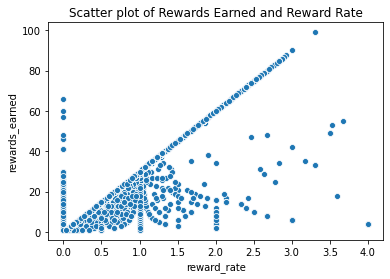

In [82]:
sns.scatterplot(churn['reward_rate'], churn['rewards_earned'])
plt.title('Scatter plot of Rewards Earned and Reward Rate')
plt.show()

In [83]:
churn['rewards_earned'].value_counts()

2.0     1242
1.0     1201
4.0      690
3.0      633
6.0      520
8.0      487
5.0      448
67.0     441
7.0      417
15.0     415
13.0     408
14.0     393
9.0      389
17.0     386
10.0     386
11.0     386
18.0     377
12.0     368
19.0     358
65.0     355
21.0     347
16.0     332
66.0     331
22.0     329
20.0     326
25.0     320
23.0     309
33.0     307
64.0     298
58.0     293
62.0     287
29.0     282
24.0     281
28.0     276
61.0     274
59.0     271
31.0     269
26.0     267
60.0     266
44.0     262
30.0     260
27.0     260
37.0     257
56.0     256
32.0     250
48.0     249
40.0     248
34.0     247
54.0     243
55.0     241
57.0     239
35.0     239
46.0     237
51.0     234
39.0     234
47.0     234
63.0     232
41.0     232
36.0     230
53.0     227
52.0     224
42.0     224
45.0     222
49.0     215
43.0     213
50.0     201
38.0     194
68.0     182
69.0      78
76.0      56
75.0      43
70.0      39
71.0      33
77.0      31
72.0      26
74.0      23
73.0      16

In [84]:
(churn['rewards_earned'].value_counts()/len(churn)) * 100

2.0     4.747525
1.0     4.590803
4.0     2.637514
3.0     2.419632
6.0     1.987692
8.0     1.861550
5.0     1.712473
67.0    1.685715
7.0     1.593976
15.0    1.586331
13.0    1.559573
14.0    1.502236
9.0     1.486946
17.0    1.475479
10.0    1.475479
11.0    1.475479
18.0    1.441076
12.0    1.406674
19.0    1.368449
65.0    1.356982
21.0    1.326402
16.0    1.269065
66.0    1.265242
22.0    1.257597
20.0    1.246130
25.0    1.223195
23.0    1.181148
33.0    1.173503
64.0    1.139100
58.0    1.119988
62.0    1.097053
29.0    1.077940
24.0    1.074118
28.0    1.055006
61.0    1.047361
59.0    1.035893
31.0    1.028248
26.0    1.020603
60.0    1.016781
44.0    1.001491
30.0    0.993846
27.0    0.993846
37.0    0.982378
56.0    0.978556
32.0    0.955621
48.0    0.951798
40.0    0.947976
34.0    0.944154
54.0    0.928864
55.0    0.921219
57.0    0.913574
35.0    0.913574
46.0    0.905929
51.0    0.894461
39.0    0.894461
47.0    0.894461
63.0    0.886816
41.0    0.886816
36.0    0.8791

In [85]:
ind = churn[churn['rewards_earned'].isnull()].index
ind

Int64Index([    0,    18,    21,    43,    53,    57,    89,    90,    95,
              100,
            ...
            26918, 26922, 26925, 26946, 26956, 26958, 26971, 26975, 26980,
            26983],
           dtype='int64', length=3020)

In [86]:
np.random.seed(1)
for i in ind:
    if churn.loc[i,'reward_rate'] > 1.5:
        churn.loc[i,'rewards_earned'] = np.random.randint(1,9)
    else:
        churn.loc[i,'rewards_earned'] = np.random.randint(1,9)

In [87]:
churn['rewards_earned'].describe()

count    26161.00000
mean        26.27671
std         22.09252
min          1.00000
25%          6.00000
50%         20.00000
75%         45.00000
max         99.00000
Name: rewards_earned, dtype: float64

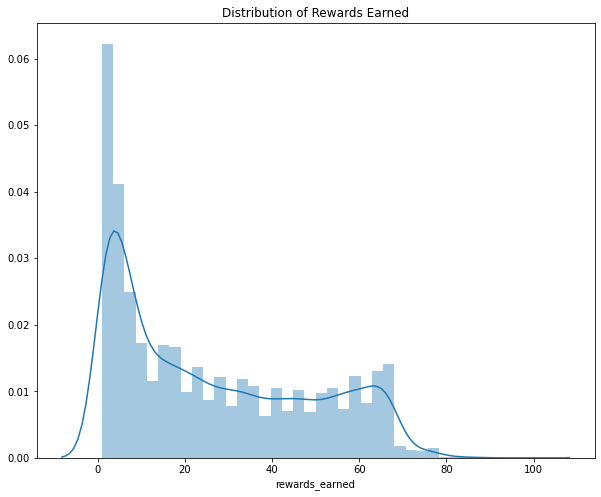

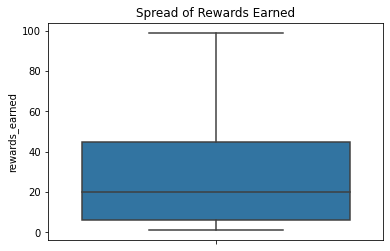

In [88]:
plt.figure(figsize = (10,8))
plt.title('Distribution of Rewards Earned')
sns.distplot(churn.rewards_earned)
plt.show()

plt.title('Spread of Rewards Earned')
sns.boxplot(y=churn.rewards_earned)

plt.show()

In [89]:
(churn['rewards_earned'].value_counts()/len(churn)) * 100

2.0     6.108329
1.0     6.035702
4.0     4.063300
3.0     3.906578
6.0     3.382898
8.0     3.279691
5.0     3.165017
7.0     3.153549
67.0    1.685715
15.0    1.586331
13.0    1.559573
14.0    1.502236
9.0     1.486946
11.0    1.475479
10.0    1.475479
17.0    1.475479
18.0    1.441076
12.0    1.406674
19.0    1.368449
65.0    1.356982
21.0    1.326402
16.0    1.269065
66.0    1.265242
22.0    1.257597
20.0    1.246130
25.0    1.223195
23.0    1.181148
33.0    1.173503
64.0    1.139100
58.0    1.119988
62.0    1.097053
29.0    1.077940
24.0    1.074118
28.0    1.055006
61.0    1.047361
59.0    1.035893
31.0    1.028248
26.0    1.020603
60.0    1.016781
44.0    1.001491
27.0    0.993846
30.0    0.993846
37.0    0.982378
56.0    0.978556
32.0    0.955621
48.0    0.951798
40.0    0.947976
34.0    0.944154
54.0    0.928864
55.0    0.921219
35.0    0.913574
57.0    0.913574
46.0    0.905929
47.0    0.894461
39.0    0.894461
51.0    0.894461
63.0    0.886816
41.0    0.886816
36.0    0.8791

As most of our observations in Rewards_Earned were in thr range of 1 to 8, we imputed null values in this range. We can see that there is no change in the distribution as well, we took reward rate as feature to fill in the null values because reward_earned was highly correlated reward_rate

In [90]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned                0
reward_rate                   0
is_referred                   0
dtype: i

In [91]:
churn['credit_score'].describe()

count    18464.000000
mean       542.540782
std         60.940995
min          2.000000
25%        507.000000
50%        541.000000
75%        578.000000
max        838.000000
Name: credit_score, dtype: float64

Skewness in rewards_earned is  0.054599076185737797


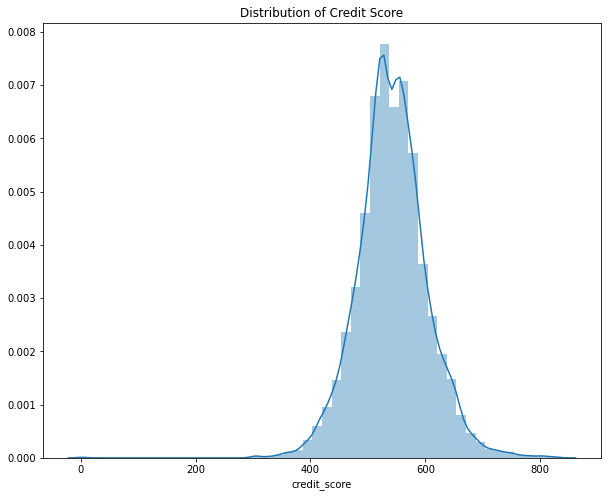

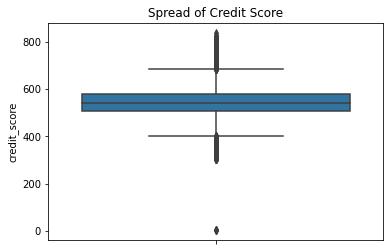

In [92]:
print('Skewness in rewards_earned is ',churn['credit_score'].skew())

# plt.subplot(1,2,1)
plt.figure(figsize = (10,8))
plt.title('Distribution of Credit Score')
sns.distplot(churn.credit_score)
plt.show()

# plt.subplot(1,2,2)
plt.title('Spread of Credit Score')
sns.boxplot(y=churn.credit_score)

plt.show()

Credit Score is kind of left skewed,and there are too many outliers in credit score.

In [93]:
churn.corr()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
user,1.000000,0.069572,-0.052853,-0.049678,-0.183040,-0.112687,-0.295397,-0.183133,-0.077210,-0.521394,-0.037164,-0.027866,-0.318575,-0.291413,-0.050088,-0.162054,-0.041302,-0.092476,-0.095748,0.017701,0.005222,-0.030189,0.027622,-0.026391,-0.029839,-0.513995,-0.487242,-0.162584
churn,0.069572,1.000000,-0.060924,-0.120880,-0.134790,-0.068891,-0.263872,-0.135305,0.059446,-0.199705,0.008829,0.011325,-0.117438,-0.058864,0.039562,0.015096,0.020464,-0.040378,0.029185,-0.015391,0.034852,0.050408,0.056632,0.006990,0.037534,-0.178803,-0.168216,-0.083379
age,-0.052853,-0.060924,1.000000,0.026397,0.108328,0.051850,0.025837,0.108021,0.079336,0.137797,0.009434,0.020809,0.181194,-0.084040,0.208630,0.172052,0.175944,-0.212756,-0.004598,0.004952,-0.014203,0.000897,0.009689,-0.023463,0.033461,0.136677,0.129479,0.019124
credit_score,-0.049678,-0.120880,0.026397,1.000000,0.043164,0.004645,0.051649,0.044150,0.025257,0.126831,0.014535,0.027873,0.080083,0.019915,0.000099,0.005718,-0.039186,0.035257,-0.012164,0.021474,0.068918,0.091455,0.016734,0.011077,0.011123,0.143777,0.152996,-0.032499
deposits,-0.183040,-0.134790,0.108328,0.043164,1.000000,0.487536,0.327707,0.998502,-0.045848,0.375191,-0.014596,-0.011529,0.450021,0.079186,0.077352,0.106805,0.043178,-0.004480,0.041484,-0.002726,0.012943,-0.008839,-0.018736,0.048301,-0.010767,0.276930,0.266232,0.227446
withdrawal,-0.112687,-0.068891,0.051850,0.004645,0.487536,1.000000,0.224939,0.486919,-0.039858,0.187295,-0.011026,-0.002472,0.295707,0.062976,0.047297,0.070908,0.040383,-0.006546,0.048969,0.002630,-0.001922,-0.006338,-0.010834,0.033638,-0.008288,0.124746,0.125618,0.208402
purchases_partners,-0.295397,-0.263872,0.025837,0.051649,0.327707,0.224939,1.000000,0.327697,-0.100499,0.594912,-0.035509,-0.032500,0.421729,0.144071,0.066872,0.121437,0.029240,0.044723,0.071075,0.000178,0.016381,-0.014069,-0.030651,0.083655,-0.030681,0.451306,0.431611,0.299272
purchases,-0.183133,-0.135305,0.108021,0.044150,0.998502,0.486919,0.327697,1.000000,-0.045865,0.375762,-0.014496,-0.011615,0.450493,0.079124,0.076928,0.106363,0.042299,-0.003638,0.041148,-0.002502,0.013248,-0.008667,-0.018578,0.048627,-0.010954,0.277455,0.266762,0.227585
cc_taken,-0.077210,0.059446,0.079336,0.025257,-0.045848,-0.039858,-0.100499,-0.045865,1.000000,0.115087,0.183383,0.156610,0.160584,0.035970,0.057515,0.070599,0.063217,-0.044929,0.040849,-0.006019,0.003381,0.045343,0.006301,-0.016480,0.086270,0.158005,0.149018,-0.022553
cc_recommended,-0.521394,-0.199705,0.137797,0.126831,0.375191,0.187295,0.594912,0.375762,0.115087,1.000000,0.047493,0.054963,0.614892,0.224935,0.134219,0.219468,0.022150,0.089798,0.125767,-0.017983,0.016228,0.045345,-0.037100,0.045381,0.038856,0.925039,0.876243,0.238888


# Null Value Treatment for Credit Score

In [94]:
churn['cc_recommended'].describe()

count    26161.000000
mean        93.052177
std         88.723054
min          0.000000
25%         10.000000
50%         66.000000
75%        164.000000
max        326.000000
Name: cc_recommended, dtype: float64

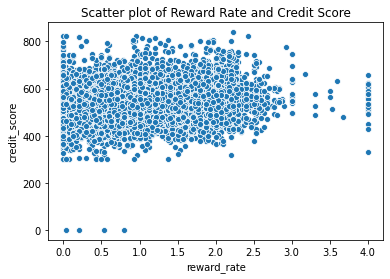

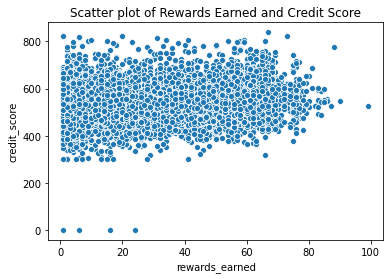

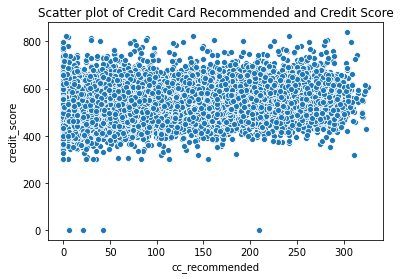

In [95]:
sns.scatterplot(churn['reward_rate'], churn['credit_score'])
plt.title('Scatter plot of Reward Rate and Credit Score')
plt.show()

sns.scatterplot(churn['rewards_earned'], churn['credit_score'])
plt.title('Scatter plot of Rewards Earned and Credit Score')
plt.show()

sns.scatterplot(churn['cc_recommended'], churn['credit_score'])
plt.title('Scatter plot of Credit Card Recommended and Credit Score')
plt.show()

In [96]:
churn.groupby('zodiac_sign')['credit_score'].mean()

zodiac_sign
Aquarius       541.567362
Aries          543.309635
Cancer         544.292861
Capricorn      546.286550
Gemini         544.743541
Leo            540.949296
Libra          539.149189
Pisces         542.182382
Sagittarius    544.678548
Scorpio        541.770460
Taurus         543.287266
Virgo          541.082300
Name: credit_score, dtype: float64

In [97]:
ind = churn[churn['credit_score'].isnull()].index
ind

Int64Index([    0,     4,     7,    10,    14,    15,    18,    19,    24,
               29,
            ...
            26975, 26978, 26980, 26981, 26983, 26985, 26988, 26991, 26996,
            26997],
           dtype='int64', length=7697)

In [98]:
np.random.seed(1)
for i in ind:
    churn.loc[i,'credit_score'] = np.random.randint(420,500)

In [99]:
churn['credit_score'].describe()

count    26161.000000
mean       518.156072
std         64.849435
min          2.000000
25%        469.000000
50%        513.000000
75%        561.000000
max        838.000000
Name: credit_score, dtype: float64

Skewness in rewards_earned is  0.4550099195012546


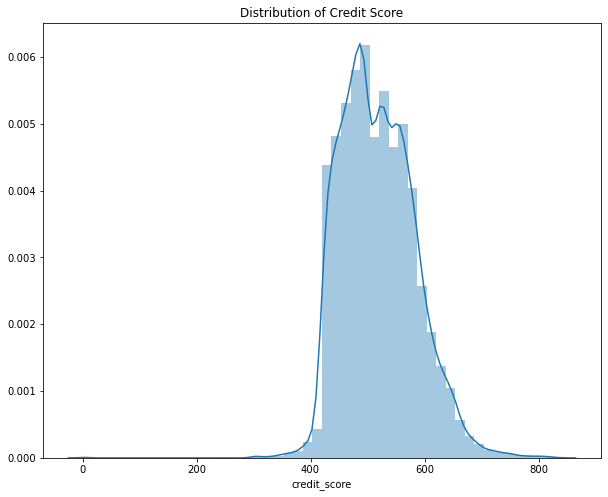

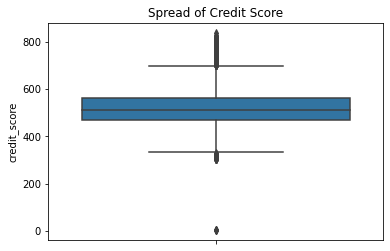

In [100]:
print('Skewness in rewards_earned is ',churn['credit_score'].skew())

# plt.subplot(1,2,1)
plt.figure(figsize = (10,8))
plt.title('Distribution of Credit Score')
sns.distplot(churn.credit_score)
plt.show()

# plt.subplot(1,2,2)
plt.title('Spread of Credit Score')
sns.boxplot(y=churn.credit_score)

plt.show()

In [101]:
churn.isnull().sum()

user                       0
churn                      0
age                        0
housing                    0
credit_score               0
deposits                   0
withdrawal                 0
purchases_partners         0
purchases                  0
cc_taken                   0
cc_recommended             0
cc_disliked                0
cc_liked                   0
cc_application_begin       0
app_downloaded             0
web_user                   0
app_web_user               0
ios_user                   0
android_user               0
registered_phones          0
payment_type               0
waiting_4_loan             0
cancelled_loan             0
received_loan              0
rejected_loan              0
zodiac_sign                0
left_for_two_month_plus    0
left_for_one_month         0
rewards_earned             0
reward_rate                0
is_referred                0
dtype: int64

We tried if we could find any high correlation of Credit Score with any other feature, so that we could impute the null values using that feature, but however we could not find any such correlation. We didn't want to drop to credit score as we believe it could be one of the most important feature in our Data AnalysisAs most of the variable in Credit Score were in a range of 420 to 500, we imputed null values with random values within this range. After imputing we could see that there has not been any change in our distribution which is good indicator that we might have imputed null values in a correct manner. We could have have imputed null values within range of 420 to 600, but since 600 is a high credit score, we didn't want to assign null values near 600, as it could affect our analysis a person with a low credit score could get a credit score around 600 which is not right.

Now our dataset contains no null value, so we shall proceed with Data Understanding and Outlier Treatment.

# Data Understanding

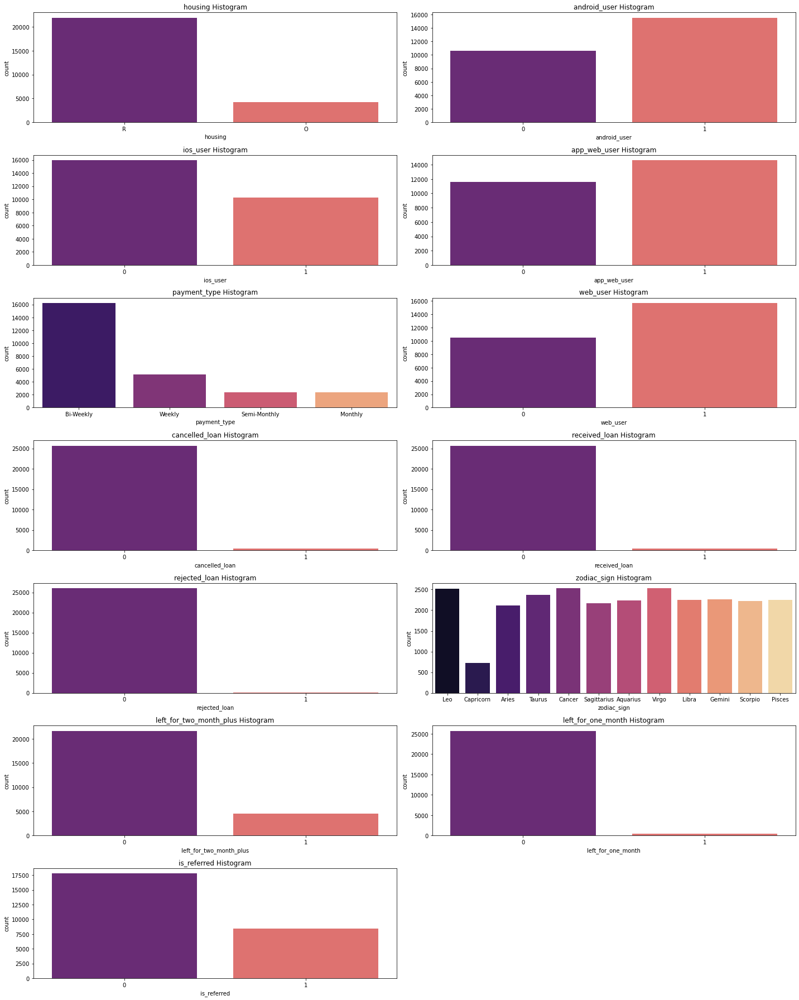

In [102]:
def plot_count(x,fig):
    plt.subplot(7,2,fig)
    plt.title(x+' Histogram')
    sns.countplot(churn[x],palette=("magma"))
    
plt.figure(figsize=(20,25))

plot_count('housing',1)
plot_count('android_user',2)
plot_count('ios_user',3)
plot_count('app_web_user',4)
plot_count('payment_type',5)
plot_count('web_user',6)
plot_count('cancelled_loan',7)
plot_count('received_loan',8)
plot_count('rejected_loan',9)
plot_count('zodiac_sign',10)
plot_count('left_for_two_month_plus',11)
plot_count('left_for_one_month',12)
plot_count('is_referred',13)

plt.tight_layout()

#### Inference :

1) Most of our user stay in an `Rented Accomodation`, this may be beacuse as majority of our users are in the age group of 25 to 35.\
2) Majority of our user's own an `Android` phone, rather than an `IOS` Phone.\
3) Also most of the customers/users who use `web` also have downloaded the `app`.\
4) We cannot make much inference out of `Received Loan`, `Cancelled Loan` and `Rejected Loan`.\
5) Most of the users did't leave us either for `one month` or `more than 2 months`.\
6) Around `30%` of the customers have been `referred` about us. Which shows a good sign.\
7) `60%` of the customers prefer to make payments `bi-weekly`.\
8) We have `equal` number of customer from every `zodiac sign`, barring Capricorn.

In [103]:
churn.columns

Index(['user', 'churn', 'age', 'housing', 'credit_score', 'deposits',
       'withdrawal', 'purchases_partners', 'purchases', 'cc_taken',
       'cc_recommended', 'cc_disliked', 'cc_liked', 'cc_application_begin',
       'app_downloaded', 'web_user', 'app_web_user', 'ios_user',
       'android_user', 'registered_phones', 'payment_type', 'waiting_4_loan',
       'cancelled_loan', 'received_loan', 'rejected_loan', 'zodiac_sign',
       'left_for_two_month_plus', 'left_for_one_month', 'rewards_earned',
       'reward_rate', 'is_referred'],
      dtype='object')

In [104]:
num_cols = churn.select_dtypes(include = np.number)

In [105]:
num_cols.drop(columns = ['user','churn','app_downloaded','web_user','app_web_user','ios_user','android_user'\
                         ,'registered_phones','waiting_4_loan','cancelled_loan','received_loan','rejected_loan'\
                         ,'left_for_one_month','left_for_two_month_plus','reward_rate','is_referred'],inplace = True)

In [106]:
print('Numerical variables are : ',num_cols.columns)

Numerical variables are :  Index(['age', 'credit_score', 'deposits', 'withdrawal', 'purchases_partners',
       'purchases', 'cc_taken', 'cc_recommended', 'cc_disliked', 'cc_liked',
       'cc_application_begin', 'rewards_earned'],
      dtype='object')


In [107]:
num_cols.shape

(26161, 12)

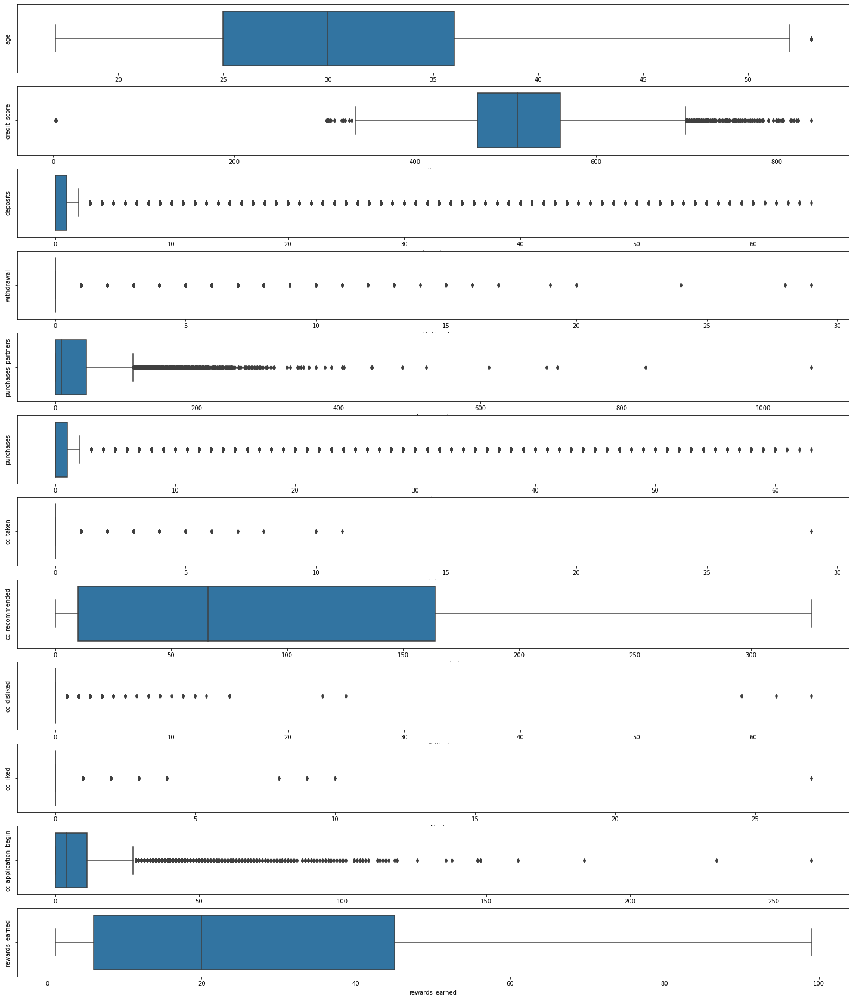

In [108]:
plt.figure(figsize=(25,30))
for i,col in enumerate(num_cols,1):
    plt.subplot(12,1,i)
    sns.boxplot(churn[col])
    plt.ylabel(col)
plt.show()

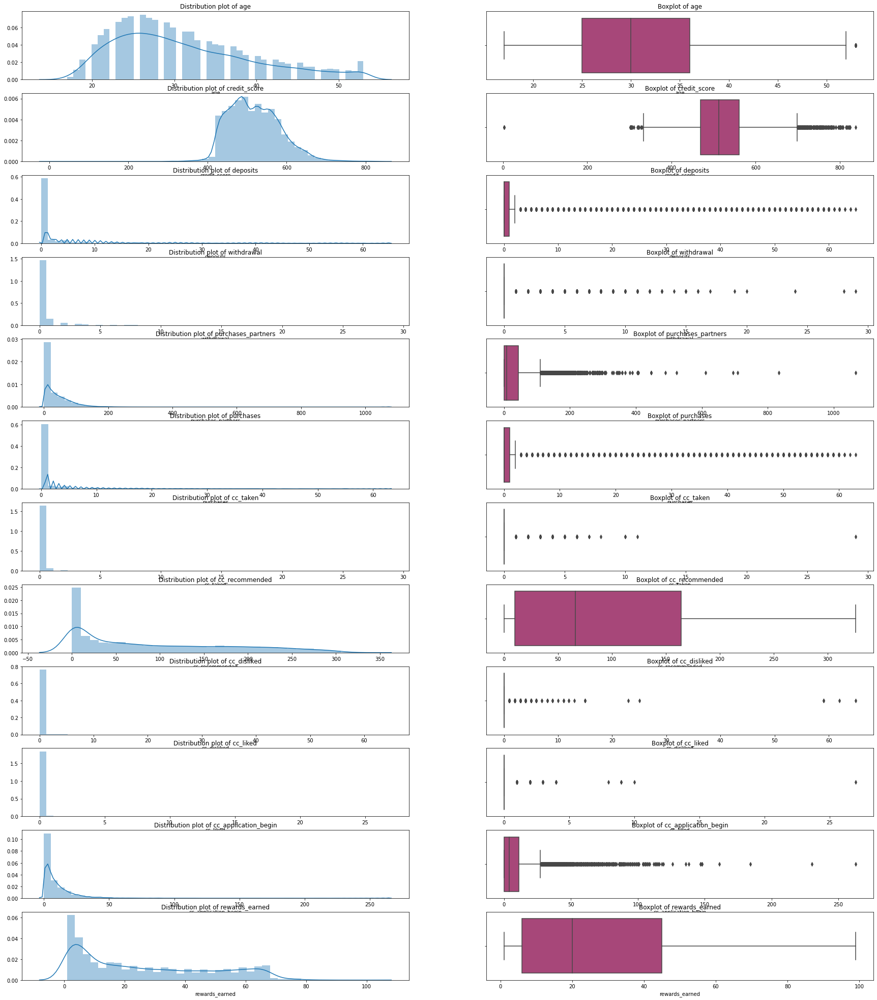

In [109]:
def plot_box(x,fig):
    plt.subplot(12,2,fig)
    #plt.figure(figsize = (15,20))
    plt.title('Distribution plot of '+x)
    sns.distplot(churn[x])
    plt.subplot(12,2,(fig+1))
    plt.title('Boxplot of '+x)
    sns.boxplot(churn[x], palette=("magma"))
    
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

Barring `Rewards Earned` and `Age` rest all of the Features contain Outliers

# Outlier Treatment for Application Begin

In [110]:
q3 = churn['cc_application_begin'].quantile(0.75)
q1 = churn['cc_application_begin'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['cc_application_begin'] > uf]
uc = churn['cc_application_begin'].quantile(0.99)

for i in churn.index:
    if churn.loc[i,'cc_application_begin'] > uf:
        churn.loc[i,'cc_application_begin'] = uc


In [111]:
outliers.shape

(1602, 31)

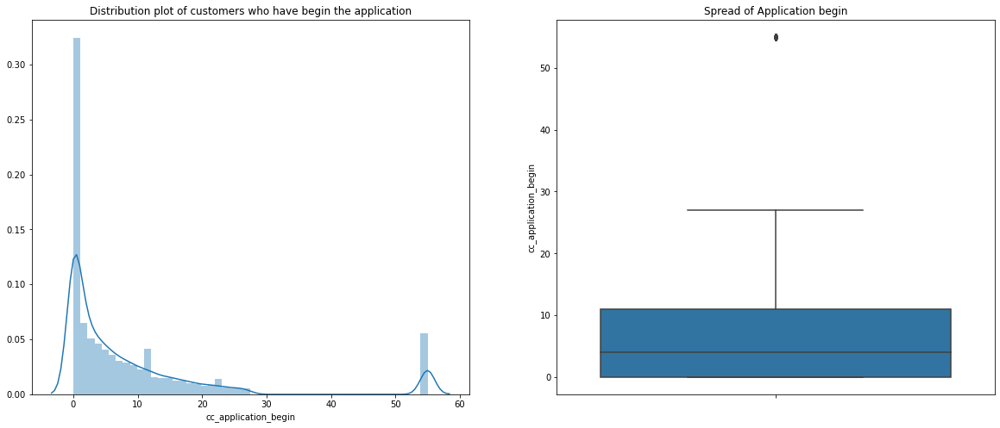

In [112]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of customers who have begin the application')
sns.distplot(churn.cc_application_begin)

plt.subplot(1,2,2)
plt.title('Spread of Application begin')
sns.boxplot(y=churn.cc_application_begin)

plt.show()

In [113]:
q3 = churn['cc_application_begin'].quantile(0.75)
q1 = churn['cc_application_begin'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['cc_application_begin'] > uf]
outliers

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
11,25899,0,41.0,O,625.0,14,0,116,13,0,217,0,0,55.0,1,1,1,1,0,0,Semi-Monthly,0,0,0,0,Virgo,0,0,65.0,2.17,0
34,42910,0,45.0,R,610.0,48,0,76,48,0,204,0,0,55.0,1,1,1,0,1,0,Weekly,0,0,0,0,Sagittarius,0,0,58.0,1.93,1
75,42253,0,30.0,R,595.0,13,0,89,12,0,257,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Libra,0,0,65.0,2.17,0
92,36751,0,39.0,R,529.0,24,1,69,24,0,218,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Sagittarius,0,0,56.0,1.87,1
121,41826,1,22.0,R,440.0,9,2,107,9,0,170,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Virgo,0,0,39.0,1.30,1
130,39733,1,29.0,R,491.0,0,0,0,0,0,177,1,0,55.0,1,0,0,0,1,0,Weekly,0,0,0,0,Sagittarius,0,0,51.0,1.70,0
137,35351,0,35.0,R,528.0,15,0,3,15,1,300,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Aquarius,0,0,65.0,2.17,0
143,45320,0,40.0,O,453.0,8,0,52,8,0,294,0,0,55.0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,Sagittarius,1,0,67.0,2.23,0
178,46856,0,22.0,R,652.0,6,1,198,6,0,301,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Libra,1,0,65.0,2.17,0
212,3148,0,24.0,R,654.0,6,0,163,6,0,290,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Cancer,1,0,67.0,2.23,0


In [114]:
outliers.shape

(1602, 31)

Even after converting the outliers to 99 Percentile, we are not able to remove the outliers, from the distribution plot we can see that the outliers are way to extreme. It's best to drop these outliers.

In [115]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [116]:
churn.shape

(24559, 31)

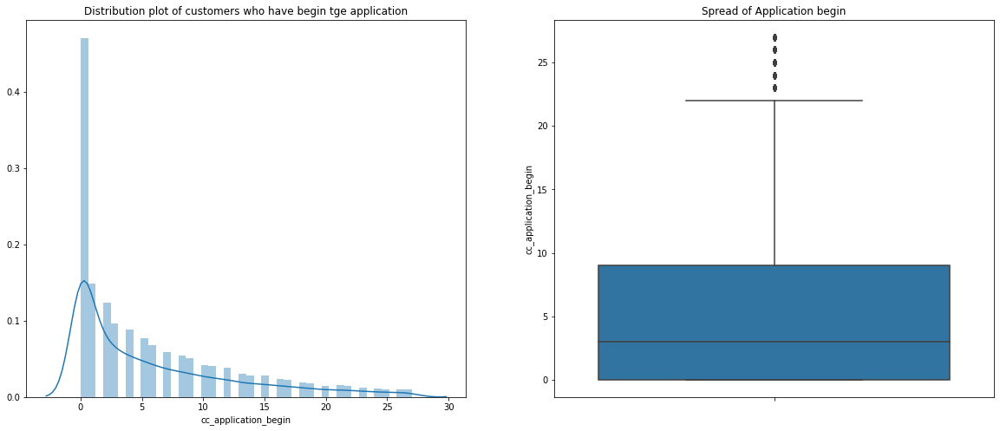

In [117]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of customers who have begin tge application')
sns.distplot(churn.cc_application_begin)

plt.subplot(1,2,2)
plt.title('Spread of Application begin')
sns.boxplot(y=churn.cc_application_begin)

plt.show()

Even after dropping the outliers, there are still some outliers left, but the range of outliers is very less, so its better to convert these outliers into 99 Pecentile or 95 Percentile.

In [118]:
q3 = churn['cc_application_begin'].quantile(0.75)
q1 = churn['cc_application_begin'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['cc_application_begin'] > uf]
outliers

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
3,8095,0,26.0,R,567.0,26,3,38,25,0,74,0,0,26.0,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,Capricorn,0,0,33.0,1.10,1
81,1011,0,46.0,R,494.0,7,2,57,7,0,168,0,0,24.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Aries,1,0,33.0,1.10,0
82,38492,0,34.0,R,490.0,0,0,0,0,1,222,9,0,24.0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,Virgo,0,0,63.0,2.10,0
149,3801,0,42.0,R,512.0,2,0,47,2,0,280,0,0,24.0,1,1,1,1,0,2,Bi-Weekly,0,0,0,0,Virgo,1,0,56.0,1.87,1
176,32820,1,39.0,R,522.0,12,1,8,12,2,147,65,0,24.0,1,1,1,1,0,0,Weekly,0,0,0,0,Virgo,0,0,44.0,1.47,1
202,10006,0,27.0,R,399.0,10,1,93,10,0,154,0,0,24.0,1,1,1,0,1,0,Weekly,0,0,0,0,Virgo,0,0,34.0,1.13,1
231,6399,0,45.0,R,429.0,0,0,0,0,0,191,0,0,25.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Cancer,0,0,59.0,1.97,0
238,47074,1,36.0,R,657.0,60,4,120,60,0,291,0,0,27.0,1,1,1,0,1,0,Monthly,0,0,0,0,Sagittarius,1,0,67.0,2.23,1
317,11596,1,45.0,O,527.0,25,2,87,24,0,238,0,0,25.0,1,0,0,1,0,0,Bi-Weekly,0,0,0,0,Sagittarius,0,0,60.0,2.00,1
355,10879,1,37.0,R,603.0,22,1,19,22,0,151,0,0,25.0,1,1,1,0,1,2,Weekly,0,0,0,0,Virgo,0,0,44.0,1.47,1


In [119]:
outliers.shape

(811, 31)

In [120]:
churn['cc_application_begin'].quantile(0.95)

21.0

In [121]:
churn['cc_application_begin'].quantile(0.99)

26.0

In [122]:
uc = churn['cc_application_begin'].quantile(0.95)

for i in churn.index:
    if churn.loc[i,'cc_application_begin'] > uf:
        churn.loc[i,'cc_application_begin'] = uc

In [123]:
churn.shape

(24559, 31)

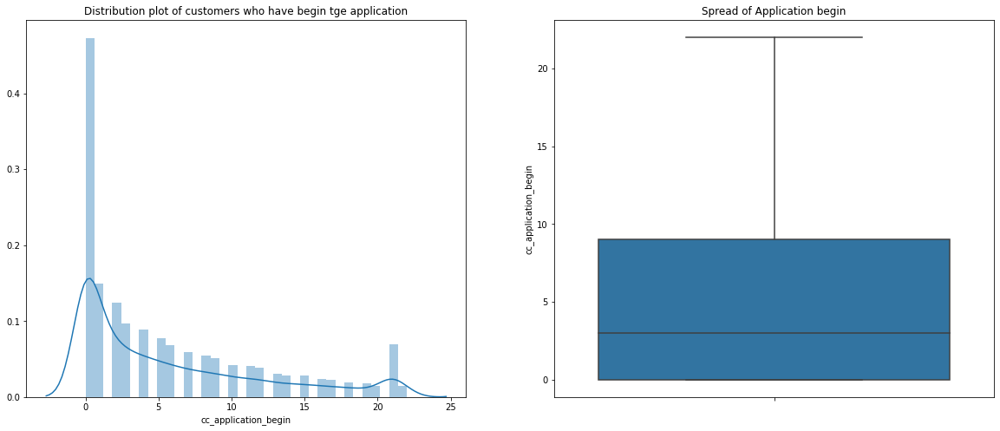

In [124]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of customers who have begin tge application')
sns.distplot(churn.cc_application_begin)

plt.subplot(1,2,2)
plt.title('Spread of Application begin')
sns.boxplot(y=churn.cc_application_begin)

plt.show()

Now there are no outliers in CC_Application_Begin. We converted into 95 Percentile because most or all of the outliers were in the range 21 to 26.

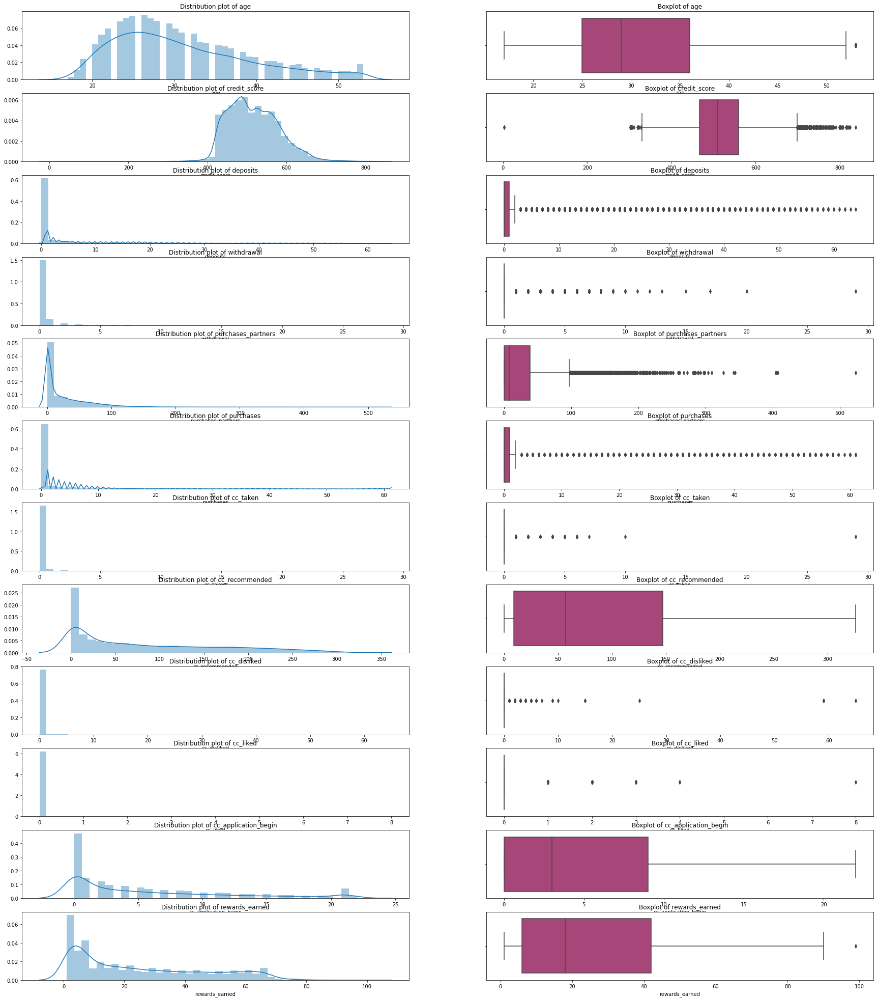

In [125]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

# Outlier Treatment of cc_liked,cc_disliked and cc_taken

In [126]:
churn['cc_liked'].value_counts()

0    24390
1      137
2       20
3        9
4        2
8        1
Name: cc_liked, dtype: int64

There are hardly any people with cc_liked > 1, its best to drop these rows

In [127]:
outliers = churn[churn['cc_liked'] > 1]
outliers.shape

(32, 31)

In [128]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [129]:
churn['cc_liked'].value_counts()

0    24390
1      137
Name: cc_liked, dtype: int64

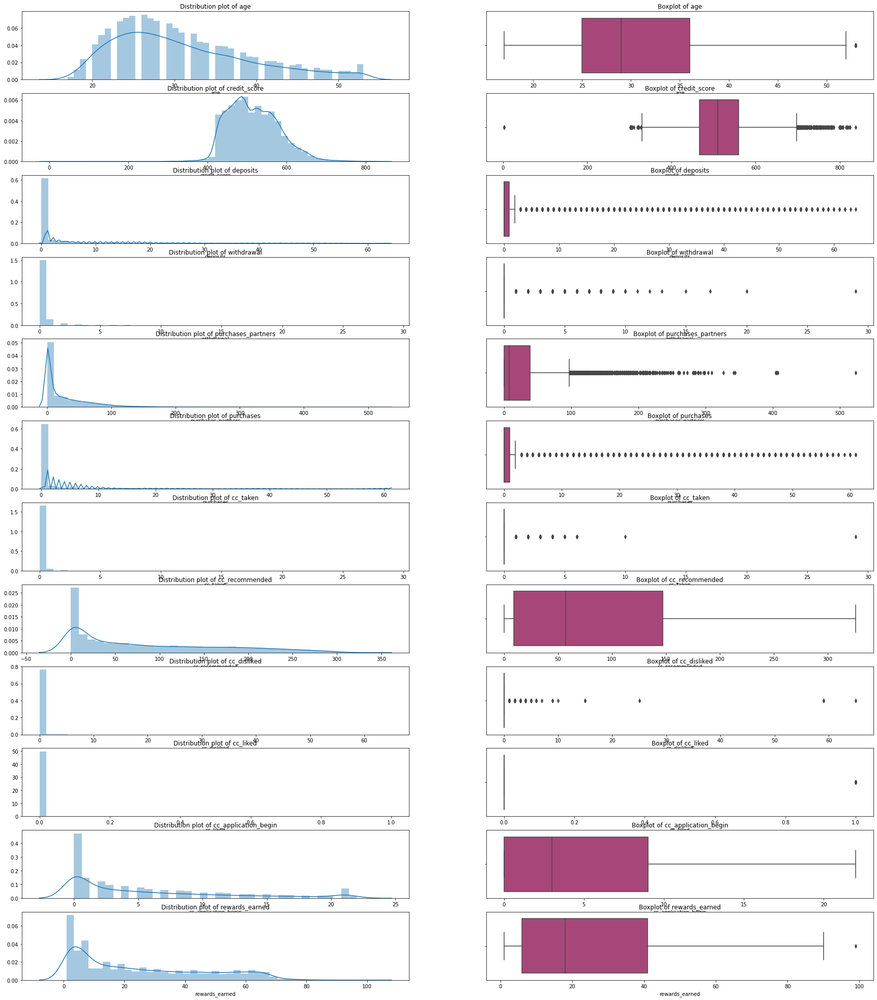

In [130]:
def plot_box(x,fig):
    plt.subplot(12,2,fig)
    #plt.figure(figsize = (15,20))
    plt.title('Distribution plot of '+x)
    sns.distplot(churn[x])
    plt.subplot(12,2,(fig+1))
    plt.title('Boxplot of '+x)
    sns.boxplot(churn[x], palette=("magma"))
    
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

In [131]:
churn['cc_disliked'].value_counts()

0     24149
1       264
2        45
4        23
3        23
5         7
6         6
15        2
59        2
9         2
10        1
25        1
7         1
65        1
Name: cc_disliked, dtype: int64

There are hardly any user who have disliked 2 or More Credit Cards, its best to drop them

In [132]:
outliers = churn[churn['cc_disliked'] > 1]
outliers.shape

(114, 31)

In [133]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [134]:
churn['cc_disliked'].value_counts()

0    24149
1      264
Name: cc_disliked, dtype: int64

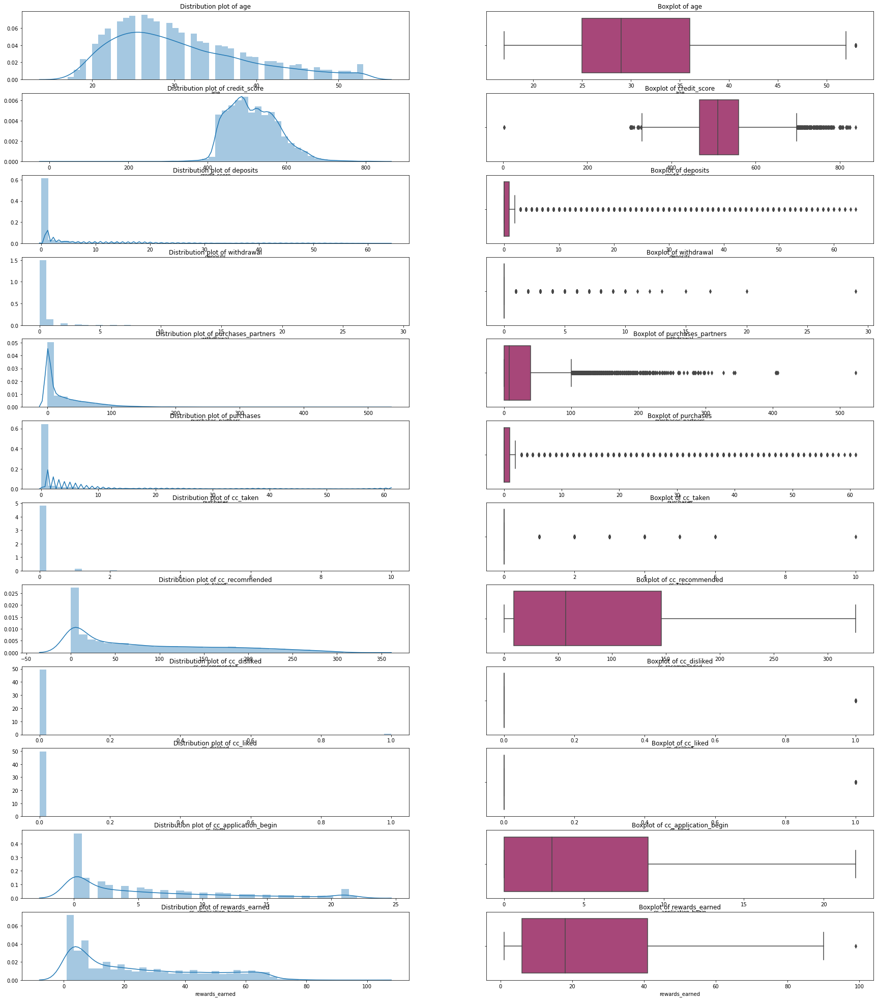

In [135]:
def plot_box(x,fig):
    plt.subplot(12,2,fig)
    #plt.figure(figsize = (15,20))
    plt.title('Distribution plot of '+x)
    sns.distplot(churn[x])
    plt.subplot(12,2,(fig+1))
    plt.title('Boxplot of '+x)
    sns.boxplot(churn[x], palette=("magma"))
    
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

In [136]:
churn['cc_taken'].value_counts()

0     23478
1       723
2       139
3        36
4        26
5         6
6         4
10        1
Name: cc_taken, dtype: int64

Again there are hardly any users taking more than 1 credit card, it is better to drop them

In [137]:
outliers = churn[churn['cc_taken'] > 1]
outliers.shape

(212, 31)

In [138]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [139]:
churn['cc_taken'].value_counts()

0    23478
1      723
Name: cc_taken, dtype: int64

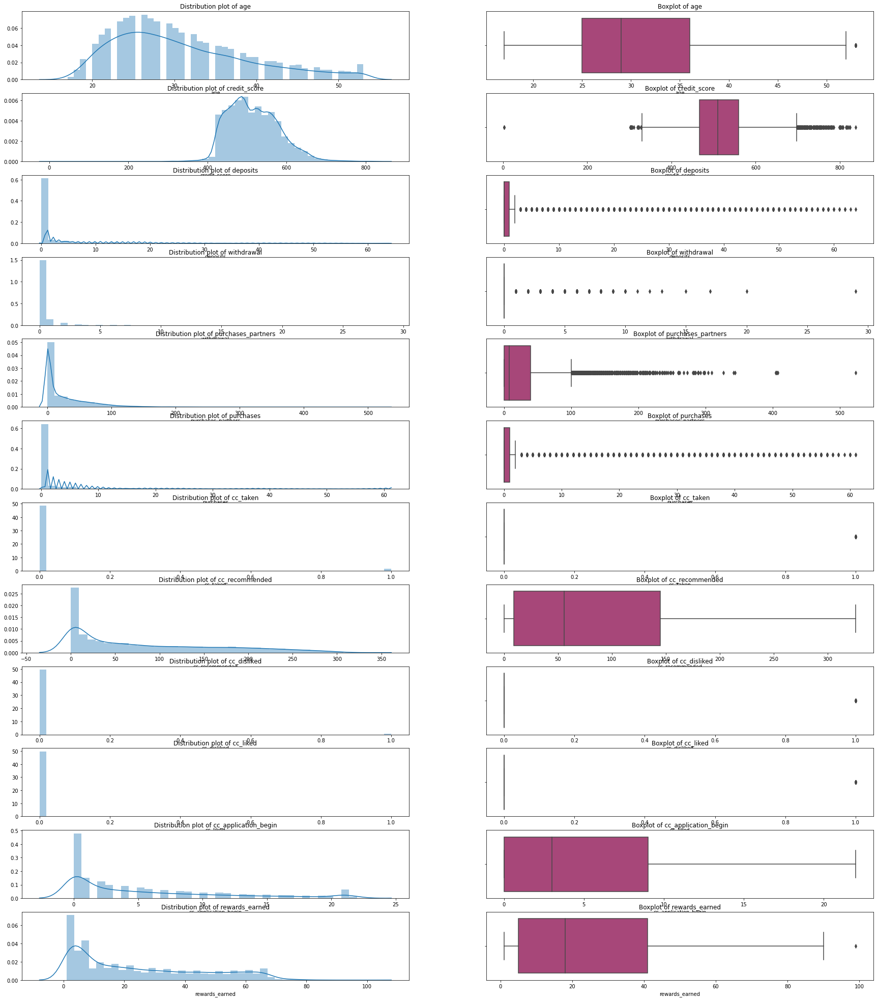

In [140]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

In [141]:
churn.shape

(24201, 31)

# Exploring purchases

In [142]:
churn['purchases'].quantile(0.95)

16.0

In [143]:
churn['purchases'].quantile(0.97)

24.0

In [144]:
churn['purchases'].quantile(0.98)

31.0

In [145]:
churn['purchases'].quantile(0.99)

40.0

In [146]:
churn['purchases'].value_counts()

0     16806
1      2210
2       977
3       621
4       405
5       363
6       289
7       234
8       181
9       163
10      157
11      141
13      110
12      103
14      101
15       93
18       89
17       87
16       73
19       67
20       58
25       48
22       48
24       45
27       45
28       42
21       35
23       33
26       33
38       31
30       30
34       29
29       29
37       28
32       26
36       25
31       25
39       23
33       22
35       19
49       19
41       19
42       19
47       18
45       18
44       18
50       16
51       16
40       16
55       15
53       13
43       10
54        9
56        9
48        9
46        9
52        8
57        5
60        5
58        3
61        2
59        1
Name: purchases, dtype: int64

In [147]:
churn6 = churn.copy()

In [148]:
q3 = churn6['purchases'].quantile(0.75)
q1 = churn6['purchases'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn6[churn6['purchases'] > uf]
outliers

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
2,58313,0,35.0,R,561.0,47,2,86,47,0,285,0,0,9.0,1,0,0,0,1,2,Semi-Monthly,0,0,0,0,Capricorn,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,74,0,0,21.0,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,Capricorn,0,0,33.0,1.10,1
5,3120,1,32.0,R,567.0,5,3,111,5,0,227,0,0,17.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Taurus,0,0,55.0,1.83,0
14,24387,0,47.0,R,495.0,11,1,20,11,0,30,0,0,10.0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,Virgo,0,0,11.0,0.69,1
16,30419,1,24.0,R,479.0,6,2,24,6,0,55,0,0,4.0,1,0,0,0,1,0,Weekly,0,0,0,0,Capricorn,0,0,27.0,0.90,0
17,30693,0,31.0,R,565.0,17,2,62,17,0,180,0,0,22.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Libra,0,0,43.0,1.43,0
23,13813,1,30.0,R,505.0,6,0,11,6,0,20,0,0,3.0,1,0,0,0,1,2,Bi-Weekly,0,0,0,0,Gemini,0,0,12.0,0.40,0
47,46400,1,38.0,R,519.0,12,2,79,12,0,105,0,0,12.0,1,1,1,1,0,4,Bi-Weekly,0,0,0,0,Pisces,0,0,37.0,1.23,1
51,40595,1,24.0,R,529.0,3,0,56,3,0,93,0,0,8.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Gemini,0,0,25.0,0.83,0
58,1826,1,48.0,O,507.0,33,0,16,31,0,185,0,0,14.0,1,1,1,1,0,2,Bi-Weekly,0,0,0,0,Aquarius,0,0,47.0,1.57,0


In [149]:
outliers.shape

(4208, 31)

In [150]:
outliers1 = churn6[churn6['purchases'] > 5]
outliers1.shape

(2819, 31)

In [151]:
for i in outliers1.index:
    churn6.drop(i,inplace = True)

In [152]:
churn6['purchases'].value_counts()

0    16806
1     2210
2      977
3      621
4      405
5      363
Name: purchases, dtype: int64

We can see purchases more than 5 are considered as outlier, and it is not right to convert purchases greater than 10 to 1 Purchase or 0 Purchase, it might affect our analysis. Its better to drop outliers greater than 5. If we drop values greater than 1, we would be losing about 2000 observations, which could be lot of loss of data.

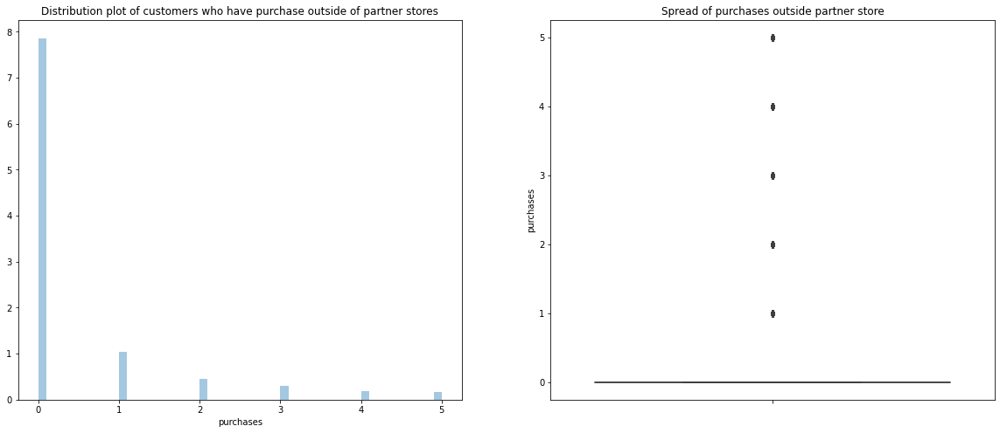

In [153]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of customers who have purchase outside of partner stores')
sns.distplot(churn6.purchases)

plt.subplot(1,2,2)
plt.title('Spread of purchases outside partner store')
sns.boxplot(y=churn6.purchases)

plt.show()

In [154]:
churn6.shape

(21382, 31)

In [155]:
churn.drop(columns = 'purchases',inplace = True)

Almost 90 % of observations have purchases 0, so its better to drop the feature purchases.

In [156]:
churn.columns

Index(['user', 'churn', 'age', 'housing', 'credit_score', 'deposits',
       'withdrawal', 'purchases_partners', 'cc_taken', 'cc_recommended',
       'cc_disliked', 'cc_liked', 'cc_application_begin', 'app_downloaded',
       'web_user', 'app_web_user', 'ios_user', 'android_user',
       'registered_phones', 'payment_type', 'waiting_4_loan', 'cancelled_loan',
       'received_loan', 'rejected_loan', 'zodiac_sign',
       'left_for_two_month_plus', 'left_for_one_month', 'rewards_earned',
       'reward_rate', 'is_referred'],
      dtype='object')

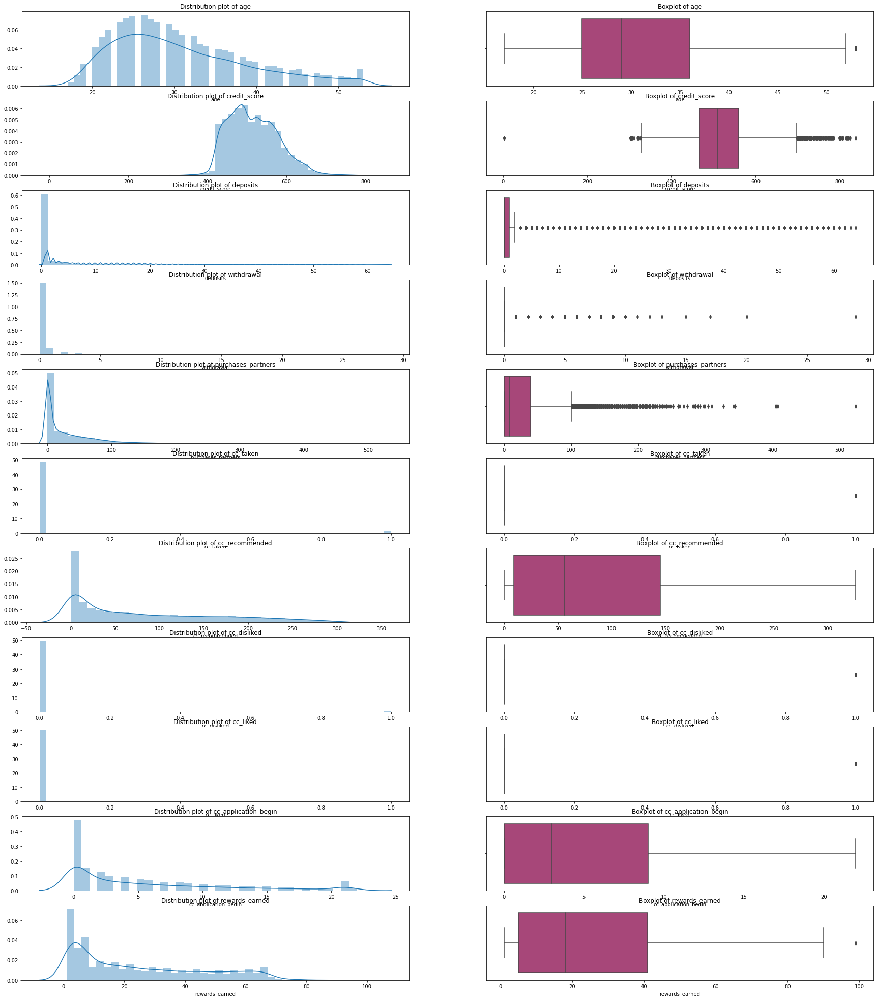

In [157]:
num_cols.drop(columns = 'purchases',inplace = True)
def plot_box(x,fig):
    plt.subplot(11,2,fig)
    #plt.figure(figsize = (15,20))
    plt.title('Distribution plot of '+x)
    sns.distplot(churn[x])
    plt.subplot(11,2,(fig+1))
    plt.title('Boxplot of '+x)
    sns.boxplot(churn[x], palette=("magma"))
    
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

# Outlier Treatment for purchase partners

In [158]:
churn['purchases_partners'].value_counts()

0      7528
1      1057
2       781
3       705
4       538
5       486
6       375
7       371
9       301
8       288
10      274
11      271
12      265
14      242
16      233
15      225
17      217
13      217
19      214
23      208
27      205
21      198
26      193
24      193
18      189
22      187
20      186
30      174
29      174
25      170
31      163
40      160
28      154
39      153
34      152
32      148
45      145
37      143
41      136
46      134
35      132
36      132
33      131
42      125
38      125
55      124
44      119
56      115
47      115
49      109
50      109
48      107
54      106
52      103
59      103
43      103
63      101
51      101
57       98
62       95
65       95
61       94
60       93
58       91
76       91
68       89
67       86
53       85
66       85
69       84
80       78
71       76
72       76
74       76
79       73
73       71
77       70
70       68
81       68
64       67
75       67
87       66
91       62
82  

In [159]:
outliers = churn[churn['purchases_partners'] > 90]
outliers.shape

(1591, 30)

In [160]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [161]:
churn.shape

(22610, 30)

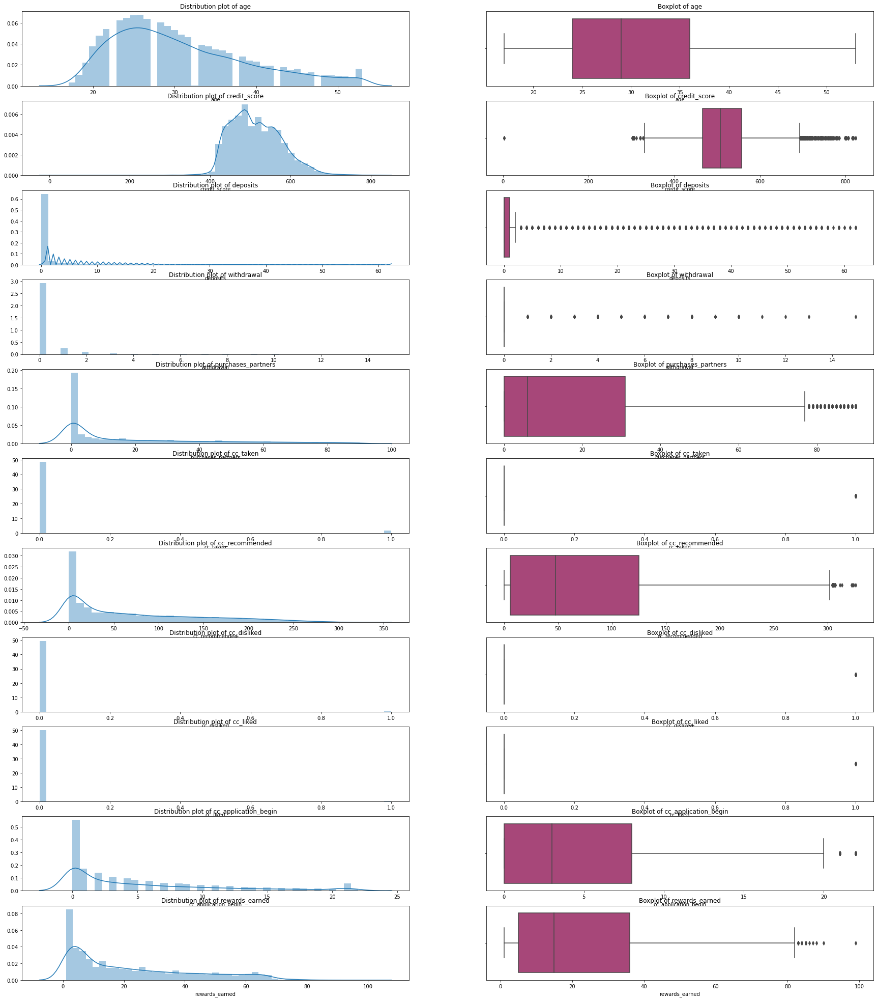

In [162]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

# Outlier treatment for withdrawals

In [163]:
churn['withdrawal'].value_counts()

0     19811
1      1662
2       591
3       273
4       125
5        61
6        37
7        18
8        16
9         7
10        5
15        1
13        1
12        1
11        1
Name: withdrawal, dtype: int64

As most of the users have 0 or 1 withdrawal, we shall convert all withdrawals greater than 1 to 1, now we can classify our feature as whether the user has withdrawan money or not.

In [164]:
for i in churn.index:
    if churn.loc[i,'withdrawal'] > 1:
        churn.loc[i,'withdrawal'] = 1

In [165]:
churn['withdrawal'].value_counts()

0    19811
1     2799
Name: withdrawal, dtype: int64

In [166]:
churn.shape

(22610, 30)

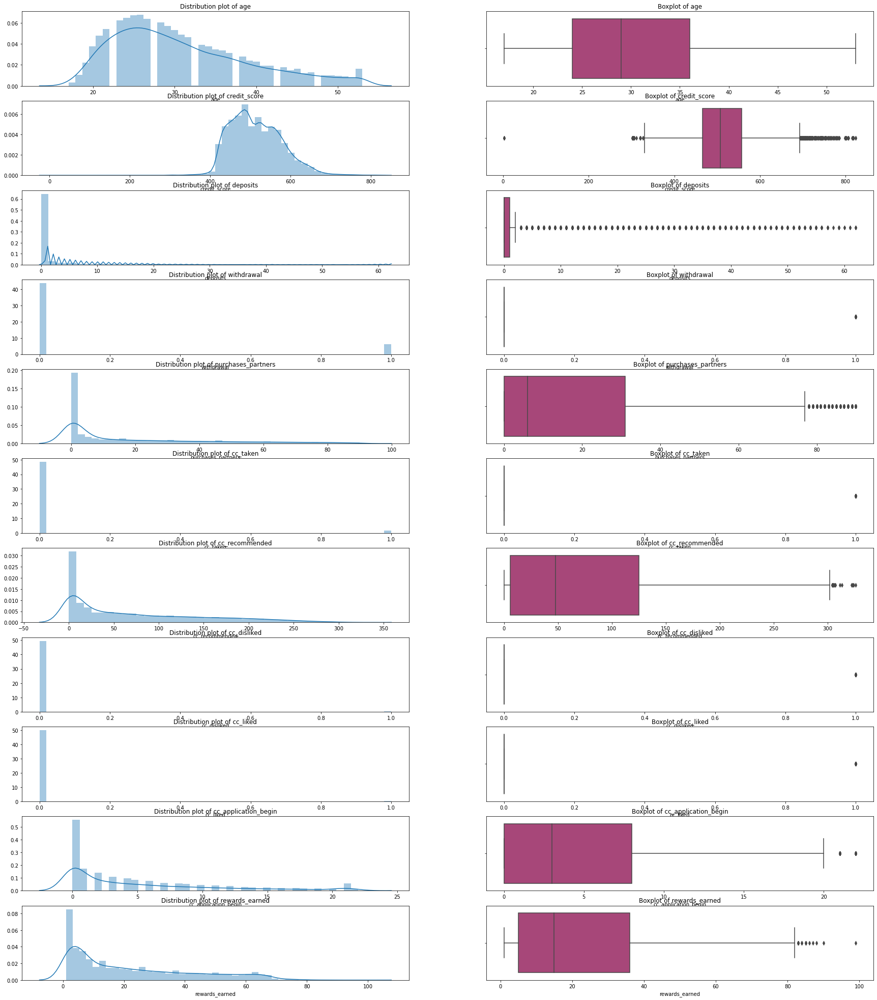

In [167]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

# Outlier Treatment for Number of Deposits

In [168]:
churn['deposits'].value_counts()

0     16084
1      2045
2       874
3       543
4       360
5       315
6       255
7       207
8       155
11      128
9       128
10      125
12       92
14       87
13       87
15       78
17       75
16       70
18       70
19       68
20       58
24       37
27       36
28       34
22       33
25       33
26       31
21       28
31       28
29       25
41       24
23       24
38       23
30       22
36       22
39       21
37       21
34       20
33       19
32       19
35       18
52       17
40       16
44       15
54       14
42       12
48       11
46       11
49       10
43       10
50       10
45        9
55        8
51        7
47        7
53        6
57        6
59        6
56        5
62        3
60        2
61        2
58        1
Name: deposits, dtype: int64

In [169]:
churn['deposits'].quantile(0.99)

39.0

In [170]:
q3 = churn['deposits'].quantile(0.75)
q1 = churn['deposits'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['deposits'] > uf]
outliers['deposits'].describe()

count    3607.000000
mean       13.297754
std        12.358508
min         3.000000
25%         4.000000
50%         8.000000
75%        17.500000
max        62.000000
Name: deposits, dtype: float64

Its not right to convert to 99 percentile as people with only 3 deposits will be converted to 39 deposits, similar to withdrawals we could convert all deposits greater than 1 to 1 and classify our feature as whether the user has done deposit or not

In [171]:
for i in churn.index:
    if churn.loc[i,'deposits'] > 1:
        churn.loc[i,'deposits'] = 1

In [172]:
churn['deposits'].value_counts()

0    16084
1     6526
Name: deposits, dtype: int64

In [173]:
churn.shape

(22610, 30)

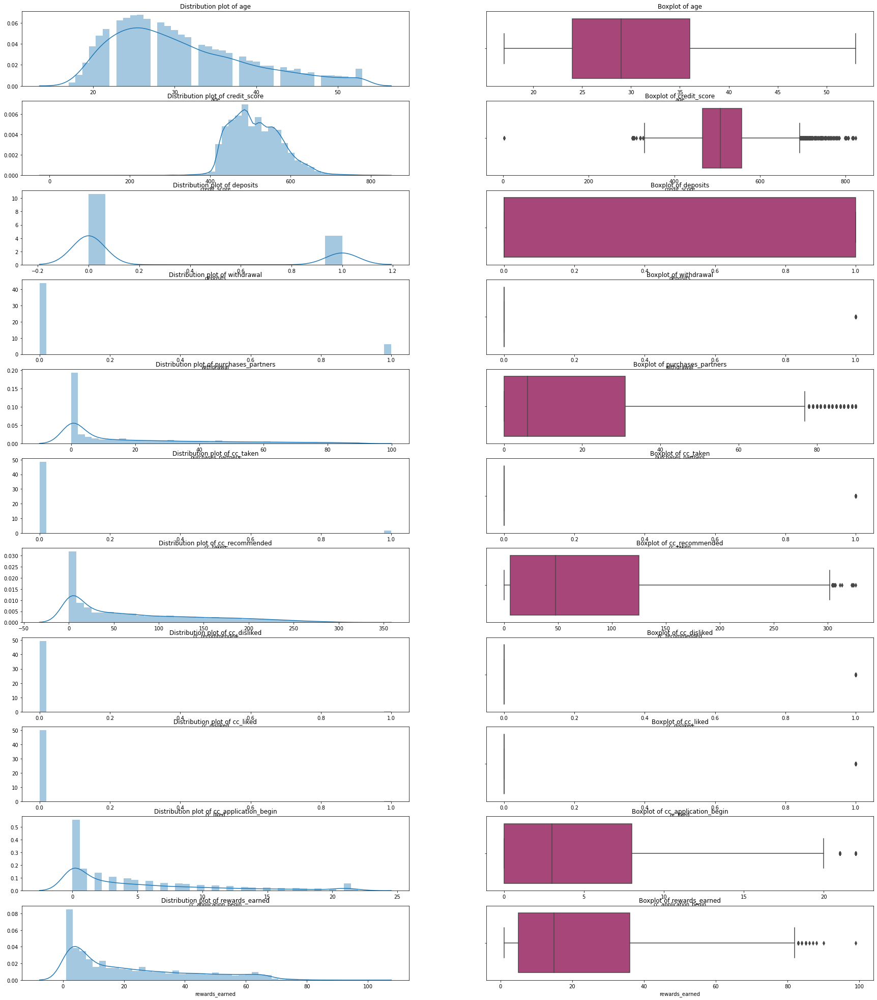

In [174]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

# Outlier Treatment for Credit Score

In [175]:
churn['credit_score'].describe()

count    22610.000000
mean       514.327952
std         63.758261
min          2.000000
25%        466.000000
50%        507.000000
75%        557.000000
max        824.000000
Name: credit_score, dtype: float64

In [176]:
q3 = churn['credit_score'].quantile(0.75)
q1 = churn['credit_score'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
lf = q1 - 1.5*iqr

uc = churn['credit_score'].quantile(0.99)
lc = churn['credit_score'].quantile(0.01)
print(lc,uc)

408.0 679.0


In [177]:
for i in churn.index:
    if churn.loc[i,'credit_score'] > uf:
        churn.loc[i,'credit_score'] = uc
    if churn.loc[i,'credit_score'] < lf:
        churn.loc[i,'credit_score'] = lc

In [178]:
churn['credit_score'].describe()

count    22610.000000
mean       514.059310
std         62.028321
min        330.000000
25%        466.000000
50%        507.000000
75%        557.000000
max        693.000000
Name: credit_score, dtype: float64

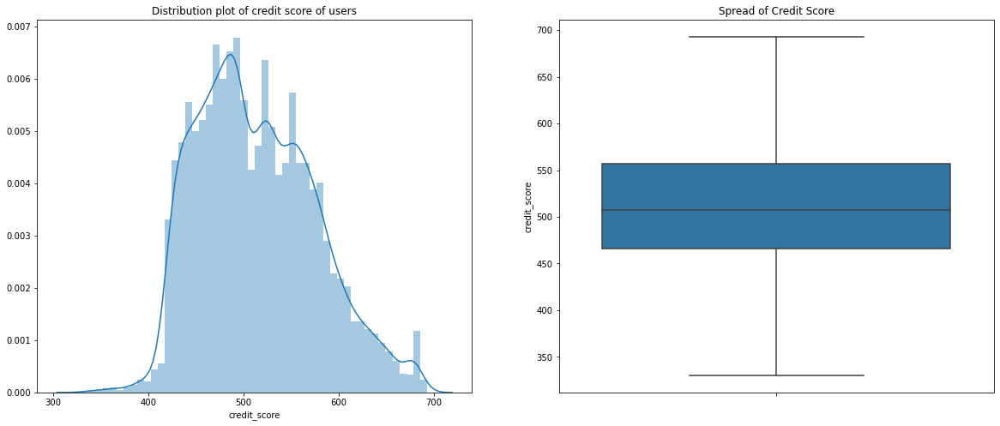

In [179]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of credit score of users')
sns.distplot(churn.credit_score)

plt.subplot(1,2,2)
plt.title('Spread of Credit Score')
sns.boxplot(y=churn.credit_score)

plt.show()

Now we are done with Outlier treatment for all the columns

# Encoding Categorical Variables

In [180]:
cat_cols = churn.select_dtypes(include = 'object')
cat_cols.head()

,housing,payment_type,zodiac_sign
0,R,Bi-Weekly,Leo
1,R,Weekly,Leo
2,R,Semi-Monthly,Capricorn
3,R,Bi-Weekly,Capricorn
4,R,Bi-Weekly,Aries


In [181]:
churn['housing'].value_counts()

R    18925
O     3685
Name: housing, dtype: int64

In [182]:
ma = {"R":1,"O":0}
churn['housing'].replace(ma,inplace = True)

In [183]:
churn['housing'].value_counts()

1    18925
0     3685
Name: housing, dtype: int64

In [184]:
churn['payment_type'].value_counts()

Bi-Weekly       13997
Weekly           4454
Semi-Monthly     2094
Monthly          2065
Name: payment_type, dtype: int64

In [185]:
pt = pd.get_dummies(churn['payment_type'],drop_first = True)

In [186]:
churn = pd.concat([churn,pt],axis = 1)
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly
0,55409,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,Leo,1,0,6.0,0.00,0,0,0,0
1,23547,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,1,1,0,0,Weekly,0,0,0,0,Leo,0,0,44.0,1.47,1,0,0,1
2,58313,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,1,0,0,0,1,2,Semi-Monthly,0,0,0,0,Capricorn,1,0,65.0,2.17,0,0,1,0
3,8095,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,Capricorn,0,0,33.0,1.10,1,0,0,0
4,61353,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Aries,1,0,1.0,0.03,0,0,0,0


In [187]:
churn.drop(columns = 'payment_type',inplace = True)
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly
0,55409,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,1,1,0,0,0,0,0,0,Leo,1,0,6.0,0.00,0,0,0,0
1,23547,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,1,1,0,0,0,0,0,0,Leo,0,0,44.0,1.47,1,0,0,1
2,58313,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,1,0,0,0,1,2,0,0,0,0,Capricorn,1,0,65.0,2.17,0,0,1,0
3,8095,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,1,0,0,0,1,0,0,0,0,0,Capricorn,0,0,33.0,1.10,1,0,0,0
4,61353,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,1,0,1,0,0,0,0,0,Aries,1,0,1.0,0.03,0,0,0,0


In [188]:
churn['zodiac_sign'].value_counts()

Virgo          2210
Cancer         2185
Leo            2133
Taurus         2071
Gemini         1975
Libra          1965
Pisces         1930
Aquarius       1923
Scorpio        1897
Sagittarius    1891
Aries          1815
Capricorn       615
Name: zodiac_sign, dtype: int64

We will have to do One Hot Encoding for Zodiac sign

In [189]:
zs = pd.get_dummies(churn['zodiac_sign'],drop_first = True)

In [190]:
churn = pd.concat([churn,zs],axis = 1)

In [191]:
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,Aries,Cancer,Capricorn,Gemini,Leo,Libra,Pisces,Sagittarius,Scorpio,Taurus,Virgo
0,55409,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,1,1,0,0,0,0,0,0,Leo,1,0,6.0,0.00,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,23547,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,1,1,0,0,0,0,0,0,Leo,0,0,44.0,1.47,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0
2,58313,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,1,0,0,0,1,2,0,0,0,0,Capricorn,1,0,65.0,2.17,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
3,8095,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,1,0,0,0,1,0,0,0,0,0,Capricorn,0,0,33.0,1.10,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,61353,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,1,0,1,0,0,0,0,0,Aries,1,0,1.0,0.03,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [192]:
churn.drop(columns = 'zodiac_sign',inplace = True)

In [193]:
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,Aries,Cancer,Capricorn,Gemini,Leo,Libra,Pisces,Sagittarius,Scorpio,Taurus,Virgo
0,55409,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,1,1,0,0,0,0,0,0,1,0,6.0,0.00,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,23547,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,1,1,0,0,0,0,0,0,0,0,44.0,1.47,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0
2,58313,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,1,0,0,0,1,2,0,0,0,0,1,0,65.0,2.17,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
3,8095,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,1,0,0,0,1,0,0,0,0,0,0,0,33.0,1.10,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,61353,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,1,0,1,0,0,0,0,0,1,0,1.0,0.03,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


# Checking for Multicollinearity

In [194]:
user = churn['user']
user.head()

0    55409
1    23547
2    58313
3     8095
4    61353
Name: user, dtype: int64

In [195]:
churn.drop(columns = 'user',inplace = True)

In [196]:
churn.corr()

,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,Aries,Cancer,Capricorn,Gemini,Leo,Libra,Pisces,Sagittarius,Scorpio,Taurus,Virgo
churn,1.000000,-0.058758,0.019972,-0.063948,-0.123741,-0.075228,-0.268287,0.062980,-0.141466,0.037756,0.023807,-0.084999,-0.051172,0.054747,0.031801,0.019198,-0.036930,0.037721,-0.017763,0.042419,0.045782,0.058341,0.013911,0.038769,-0.122808,-0.113255,-0.062648,0.000073,-0.015232,0.044169,0.004175,0.009704,0.005562,-0.004726,0.004320,-0.007133,0.012401,-0.001883,-0.000484,-0.015566,0.002142
age,-0.058758,1.000000,-0.057444,0.023305,-0.004441,0.015134,-0.002493,0.037724,0.109192,-0.007177,0.003299,0.116106,-0.102268,0.206030,0.160359,0.168559,-0.216173,-0.011262,0.004722,-0.014777,0.002286,0.012055,-0.028499,0.024720,0.108783,0.101056,0.000468,0.062427,0.007440,-0.043549,0.013096,0.015621,0.010086,0.010810,-0.001854,-0.009379,0.017748,-0.013686,-0.010787,-0.008968,-0.013209
housing,0.019972,-0.057444,1.000000,-0.032189,0.012847,0.005884,0.008703,-0.004196,-0.010796,0.004241,-0.011393,0.001895,0.007476,-0.009865,-0.006573,0.011658,-0.003352,0.003801,-0.010232,-0.011537,-0.020328,0.000653,-0.006359,-0.010111,-0.011618,-0.011419,0.028225,-0.015980,-0.007732,-0.004541,-0.004050,-0.010491,-0.006454,-0.003865,0.003949,-0.002441,0.005808,-0.001212,0.004395,-0.002269,0.007737
credit_score,-0.063948,0.023305,-0.032189,1.000000,0.099286,0.071143,0.144330,0.055151,0.259105,0.036363,0.030345,0.236519,0.112028,0.045141,0.088551,-0.003870,0.052890,0.041160,0.000357,0.031744,0.081639,0.002158,0.008762,0.021247,0.256791,0.258446,0.063304,0.002147,0.027809,-0.000043,0.007215,0.003401,0.002939,0.005952,-0.006273,-0.008587,0.000818,0.002161,-0.006789,-0.000467,0.002134
deposits,-0.123741,-0.004441,0.012847,0.099286,1.000000,0.590095,0.430831,-0.079157,0.207135,-0.046964,-0.021033,0.339840,0.148197,0.018954,0.079603,0.053422,0.019007,0.038117,0.006277,-0.000753,-0.027933,-0.027448,0.025035,-0.034554,0.110721,0.145150,0.287150,-0.002042,-0.000471,0.002068,0.007591,-0.005175,0.003295,-0.009351,-0.001554,-0.005947,0.006266,0.020518,-0.014624,-0.000934,0.004312
withdrawal,-0.075228,0.015134,0.005884,0.071143,0.590095,1.000000,0.288750,-0.056867,0.137309,-0.029464,-0.019292,0.263308,0.087450,0.025128,0.060776,0.040053,0.004606,0.029008,0.004745,0.000104,-0.013442,-0.021773,0.024113,-0.017006,0.074026,0.090242,0.217199,0.002034,0.006844,0.001897,0.004602,-0.005223,0.010622,-0.002613,0.009164,-0.010610,-0.005250,0.012566,-0.011547,0.003082,0.004709
purchases_partners,-0.268287,-0.002493,0.008703,0.144330,0.430831,0.288750,1.000000,-0.124627,0.516716,-0.069031,-0.043771,0.407235,0.180058,0.023066,0.096760,0.015083,0.075938,0.068583,-0.002158,-0.002573,-0.015481,-0.036335,0.082914,-0.042888,0.375017,0.361085,0.296504,-0.018853,0.011991,-0.006036,-0.000143,-0.006227,0.004285,-0.014141,-0.006312,0.003844,0.008399,0.007109,-0.006890,0.010210,0.001145
cc_taken,0.062980,0.037724,-0.004196,0.055151,-0.079157,-0.056867,-0.124627,1.000000,0.136999,0.162032,0.096550,0.142396,0.042285,0.035212,0.052215,0.036715,-0.017986,0.018864,-0.006625,0.004546,0.023552,0.014574,-0.028112,0.048083,0.180328,0.165971,-0.036191,-0.011372,-0.002567,0.010476,0.003665,0.004365,0.006698,0.004314,-0.010498,0.002825,0.006554,-0.004966,0.003935,-0.001067,0.001127
cc_recommended,-0.141466,0.109192,-0.010796,0.259105,0.207135,0.137309,0.516716,0.136999,1.000000,0.103833,0.071385,0.663689,0.224458,0.093970,0.185593,-0.005229,0.118561,0.117216,-0.019791,0.003757,0.053867,-0.032914,0.025119,0.036467,0.921357,0.858364,0.174706,-0.035661,0.017007,0.006510,0.003673,-0.001589,0.012732,-0.012214,-0.010842,0.007615,0.013260,-0.009362,0.000693,0.0

In [197]:
churn.head()

,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,Aries,Cancer,Capricorn,Gemini,Leo,Libra,Pisces,Sagittarius,Scorpio,Taurus,Virgo
0,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,1,1,0,0,0,0,0,0,1,0,6.0,0.00,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,1,1,0,0,0,0,0,0,0,0,44.0,1.47,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0
2,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,1,0,0,0,1,2,0,0,0,0,1,0,65.0,2.17,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
3,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,1,0,0,0,1,0,0,0,0,0,0,0,33.0,1.10,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,1,0,1,0,0,0,0,0,1,0,1.0,0.03,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [198]:
churn9 = churn.copy()

For doing check of Multicollinearity we shall create a copy of our original dataset

In [199]:
churn9.drop(columns = 'churn',inplace = True)

In [200]:
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(churn9.values,i) for i in range(churn9.shape[1])]
vif["Features"] = churn9.columns
vif

,VIF,Features
0,15.750743,age
1,6.055037,housing
2,64.283393,credit_score
3,2.583410,deposits
4,1.775871,withdrawal
5,2.961386,purchases_partners
6,1.154052,cc_taken
7,18.434637,cc_recommended
8,1.071477,cc_disliked
9,1.029160,cc_liked


`App downloaded` is having high vif, this may be because we have a column named `app_web_user` which also has some features of whether the person has downloaded the app or not, same can go `web_user` and `app_web_user`. Let's just first drop only `app_downloaded` and see the results, may be the vif of `web_user` and `app_web_user` may come down. Also vif of `rewards_earned` is high, this may be because it ismutually exclusive or dependent on `reward_rate`, lets try dropping `rewards_earned` and see if vif of `reward_rate` reduces 

In [201]:
churn9.drop(columns = ['app_downloaded','rewards_earned'],inplace = True)

In [202]:
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(churn9.values,i) for i in range(churn9.shape[1])]
vif["Features"] = churn9.columns
vif

,VIF,Features
0,14.750296,age
1,5.867067,housing
2,38.938199,credit_score
3,2.554980,deposits
4,1.775451,withdrawal
5,2.895198,purchases_partners
6,1.150686,cc_taken
7,10.616786,cc_recommended
8,1.070726,cc_disliked
9,1.029133,cc_liked


Vif of `web_user` and `app_web_user` this is because they are mutually exclusive events,lets check the results if we drop `web_user`.

In [203]:
churn9.drop(columns = 'web_user',inplace = True)

In [204]:
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(churn9.values,i) for i in range(churn9.shape[1])]
vif["Features"] = churn9.columns
vif

,VIF,Features
0,13.790984,age
1,5.786350,housing
2,31.848079,credit_score
3,2.553135,deposits
4,1.775451,withdrawal
5,2.894384,purchases_partners
6,1.150348,cc_taken
7,10.611571,cc_recommended
8,1.070642,cc_disliked
9,1.029102,cc_liked


In [205]:
churn9.drop(columns = 'credit_score',inplace = True)

In [206]:
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(churn9.values,i) for i in range(churn9.shape[1])]
vif["Features"] = churn9.columns
vif

,VIF,Features
0,10.282227,age
1,5.394398,housing
2,2.550383,deposits
3,1.775343,withdrawal
4,2.890446,purchases_partners
5,1.150249,cc_taken
6,10.608790,cc_recommended
7,1.070299,cc_disliked
8,1.029063,cc_liked
9,3.559043,cc_application_begin


Even though Vif of `credit card recommended` and `age` is slightly high we might not drop as these could be an importsnt features in our analysis.`Age` could tell which age group of people are more likely to churn or not churn. `Credit Card Recommendation ` could tell us why a particular user has been recommended a 'n' number of cedit cards, or are more people are not likely/likely to churn on the basis of number of credit cards recommended.

So after doing test of Multicollinearity, the columns we shall be dropping are `credit_score`,`web_user`,`app_downloaded`and `rewards_earned`.

In [207]:
churn.drop(columns = ['credit_score','web_user','app_downloaded','rewards_earned'],inplace = True)

In [208]:
churn.shape

(22610, 37)

# Pickling the File

In [209]:
import pickle

In [210]:
with open('Churn_EDA','wb') as file:
    pickle.dump(churn,file)